# Obligatorio - Taller de Deep Learning

**Fecha de entrega:** 3/12/2025  
**Puntaje máximo:** 50 puntos

**Alumno(s):** Natialia Campiglia - Maria Jose Carbajal

## Obligatorio

El objetivo de este obligatorio es evaluar su conocimiento en Deep Learning mediante la implementación completa de un modelo de segmentación de imágenes basado en el paper [**"U-Net: Convolutional Networks for Biomedical Image Segmentation"**](https://arxiv.org/pdf/1505.04597). Toda la implementación debe realizarse desde cero utilizando PyTorch, y los estudiantes tendrán la libertad de ajustar ciertos hiperparámetros y configuraciones mientras mantengan la esencia del paper original.

### **Competencia en Kaggle**

Además, como parte de este obligatorio, participarán en una competencia privada en Kaggle donde se les proporcionará un dataset de test oculto (sin target). Deberán subir sus predicciones a Kaggle y se evaluarán en función de la métrica **Dice Coefficient (Coeficiente de Dice)**. Esta competencia les permitirá comparar sus resultados con los de sus compañeros en un entorno real de evaluación.

### **¿Qué es el Dice Coefficient?**
El **Dice Coefficient**, también conocido como F1-score para segmentación, es una métrica utilizada para evaluar la similitud entre la predicción y la verdad del terreno en tareas de segmentación. Se define de la siguiente manera:

$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$

Donde:
- $A$ es el conjunto de píxeles predichos como pertenecientes a la clase positiva.
- $B$ es el conjunto de píxeles verdaderos pertenecientes a la clase positiva.
- $|A \cap B|$ es la intersección de $A$ y $B$, es decir, los píxeles correctamente predichos como positivos.

Un valor de Dice de **1** indica una predicción perfecta, mientras que un valor de **0** indica que no hay coincidencia entre la predicción y el valor verdadero. Durante la competencia de Kaggle, deberán obtener un puntaje de al menos **0.75** en la métrica Dice para considerarse aprobados.

### **Criterios a Evaluar**

1. **Análisis del Dataset (5 puntos):**
   - Exploración y visualización del dataset para comprender su estructura y características.
   - Justificación de las decisiones tomadas en la preprocesamiento de datos, como normalización, aumento de datos (data augmentation), y partición del dataset en conjuntos de entrenamiento, validación y prueba.

2. **Implementación Correcta del Modelo U-Net (20 puntos):**
   - Construcción de la arquitectura U-Net siguiendo la estructura descrita en el paper, permitiendo ajustes como el número de filtros, funciones de activación y métodos de inicialización de pesos.
   - Se aceptan mejoras como el uso de técnicas adicionales como batch normalization, otras funciones de activación, etc.

3. **Entrenamiento del Modelo (10 puntos):**
   - Configuración adecuada del ciclo de entrenamiento, incluyendo la elección de la función de pérdida y del optimizador (Adam, SGD, etc.).
   - Uso de técnicas de regularización para mejorar la generalización del modelo, como el dropout, normalización de batch y data augmentation.
   - Gráficas y análisis de la evolución del entrenamiento, mostrando las curvas de pérdida y métricas relevantes tanto en el conjunto de entrenamiento como en el de validación.
   - Puede utilizarse experimentación con hiperparámetros con Weights & Biases (W&B) para optimizar el rendimiento del modelo. Este punto no es obligatorio, pero se valorará positivamente si se justifica su uso y se presentan resultados claros.

4. **Evaluación de Resultados (10 puntos):**
   - Evaluación exhaustiva del modelo utilizando métricas de segmentación como **Dice Coefficient**.
   - Análisis detallado de los resultados, incluyendo un análisis de errores para identificar y discutir casos difíciles.
   - Visualización de ejemplos representativos de segmentaciones correctas e incorrectas, comparando con las etiquetas manuales proporcionadas en el dataset.

5. **Participación y Resultados en la Competencia Kaggle (5 puntos):**
   - Participación activa en la competencia de Kaggle, con al menos una (1) subida de predicción.
   - Puntaje obtenido en la tabla de posiciones de Kaggle, evaluado en base al **Dice Coefficient** en el conjunto de test oculto. Es necesario obtener al menos un valor de **0.75** para esta métrica.

   Notas:
   - **Cualquier decisión debe ser justificada en el notebook.**
   - El **Dice Coefficient** es la métrica utilizada para evaluar la precisión de los modelos de segmentación de imágenes en esta competencia.

### **Run-Length Encoding (RLE)**

Dado que no se suben las imágenes segmentadas directamente a Kaggle, se requiere usar **Run-Length Encoding (RLE)** para comprimir las máscaras de predicción en una cadena de texto que será evaluada. El **RLE** es una técnica de compresión donde se representan secuencias consecutivas de píxeles en formato `start length`, indicando la posición de inicio y la longitud de cada secuencia de píxeles positivos.

Para calcular el **RLE**, se sigue el siguiente proceso:

1. Se aplanan las máscaras predichas en un solo vector
2. Se identifican los píxeles con valor positivo (1) y se calculan las secuencias consecutivas.
3. Se registra la posición de inicio de cada secuencia y su longitud en formato `start length`.

Este formato comprimido se sube a Kaggle en lugar de las imágenes segmentadas.

#### **Ejemplo de RLE**

```python
import numpy as np

def rle_encode(mask):
    pixels = np.array(mask).flatten(order='F')  # Aplanar la máscara en orden Fortran
    pixels = np.concatenate([[0], pixels, [0]])  # Añadir ceros al principio y final
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1  # Encontrar transiciones
    runs[1::2] = runs[1::2] - runs[::2]  # Calcular longitudes
    return ' '.join(str(x) for x in runs)

mask = np.array([[0, 0, 1, 0, 0],
                 [0, 1, 1, 1, 0],
                 [1, 1, 1, 0, 0],
                 [0, 0, 0, 1, 1]])

print(rle_encode(mask))
```

> **Salida:** 3 1 6 2 9 3 14 1 16 1 20 1


### **Sobre el Dataset**

El dataset proporcionado para esta tarea incluirá imágenes y máscaras para la segmentación de un conjunto específico de clases. El conjunto de entrenamiento estará disponible para su uso durante todo el proceso de desarrollo y pruebas, mientras que el conjunto de validación se mantendrá oculto para la evaluación final en Kaggle.

### **Instrucciones de Entrega**

- Deberán entregar un Jupyter Notebook (.ipynb) que contenga todo el código y las explicaciones necesarias para ejecutar la implementación, el entrenamiento y la evaluación del modelo.
- El notebook debe incluir secciones bien documentadas explicando las decisiones de diseño del modelo, los experimentos realizados, y los resultados obtenidos.
- El código debe estar escrito de manera clara.
- La entrega debe realizarse a través de la plataforma de gestión de ORT (gestion.ort.edu.uy) antes de la fecha límite.

### **Materiales Adicionales**

Para facilitar su trabajo, pueden consultar los siguientes recursos:

- [U-Net: Convolutional Networks for Biomedical Image Segmentation (paper original)](https://arxiv.org/abs/1505.04597)
- [Documentación de PyTorch](https://pytorch.org/docs/stable/index.html)
- [Tutoriales y recursos adicionales en Kaggle](https://www.kaggle.com/)
- [Convolución Transpuesta](https://d2l.ai/chapter_computer-vision/transposed-conv.html)

### **Competencia Kaggle**

[Link a la competencia Kaggle](https://www.kaggle.com/competitions/tdl-obligatorio-2025)

---

# Integrantes del grupo

Natalia Campiglia - 349251

Maria Jose Carbajal - 241319

# Imports e inicializaciones

In [1]:
!pip install kaggle
!pip install torchinfo

In [137]:
import os, json, random
import hashlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math

from collections import Counter
from PIL import Image
from pathlib import Path

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import transforms
import torchvision.transforms.v2 as T
from torch.utils.data import random_split, DataLoader, Dataset, Subset
import torch.optim as optim
import torch.nn.functional as F

from utils import (
    train,
    evaluate,
    model_classification_report,
    plot_training,
    match_output_dim,
    plot_confusion_matrix,
    print_metrics_report,
    predict_and_build_submission,
    match_output_to_dim
)

### Reload imports sin necesidad de restart la notebook

In [136]:
import importlib
import sys
if 'utils' in sys.modules:
    importlib.reload(sys.modules['utils'])

In [6]:
# Fijamos la semilla para que los resultados sean reproducibles
SEED = 23

torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [7]:
import sys

# definimos el dispositivo que vamos a usar
DEVICE = "cpu"  # por defecto, usamos la CPU
if torch.cuda.is_available():
    DEVICE = "cuda"  # si hay GPU, usamos la GPU
elif torch.backends.mps.is_available():
    DEVICE = "mps"  # si no hay GPU, pero hay MPS, usamos MPS
elif torch.xpu.is_available():
    DEVICE = "xpu"  # si no hay GPU, pero hay XPU, usamos XPU

print(f"Usando {DEVICE}")

NUM_WORKERS = 0 # Win y MacOS pueden tener problemas con múltiples workers
if sys.platform == 'linux':
    NUM_WORKERS = 4  # numero de workers para cargar los datos (depende de cada caso)

print(f"Usando {NUM_WORKERS}")

Usando cuda
Usando 4


## Constantes

In [8]:
BATCH_SIZE = 16  # tamaño del batch
IMG_SIZE = 256 # paper original: 572
NUM_CLASES = 1

IMG_FOLDER = "data/train/images"
MASK_FOLDER = "data/train/masks"
TEST_FOLDER = "data/test/images"

# Dataset

In [7]:
with open("config/kaggle.json") as f:
    creds = json.load(f)

os.environ["KAGGLE_USERNAME"] = creds["username"]
os.environ["KAGGLE_KEY"] = creds["key"]

In [8]:
!kaggle competitions download -c tdl-obligatorio-2025

tdl-obligatorio-2025.zip: Skipping, found more recently modified local copy (use --force to force download)


In [9]:
!unzip -o -qq tdl-obligatorio-2025.zip -d data/

# Exploración de datos

## Ver selección random de imágenes y sus máscaras

3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)


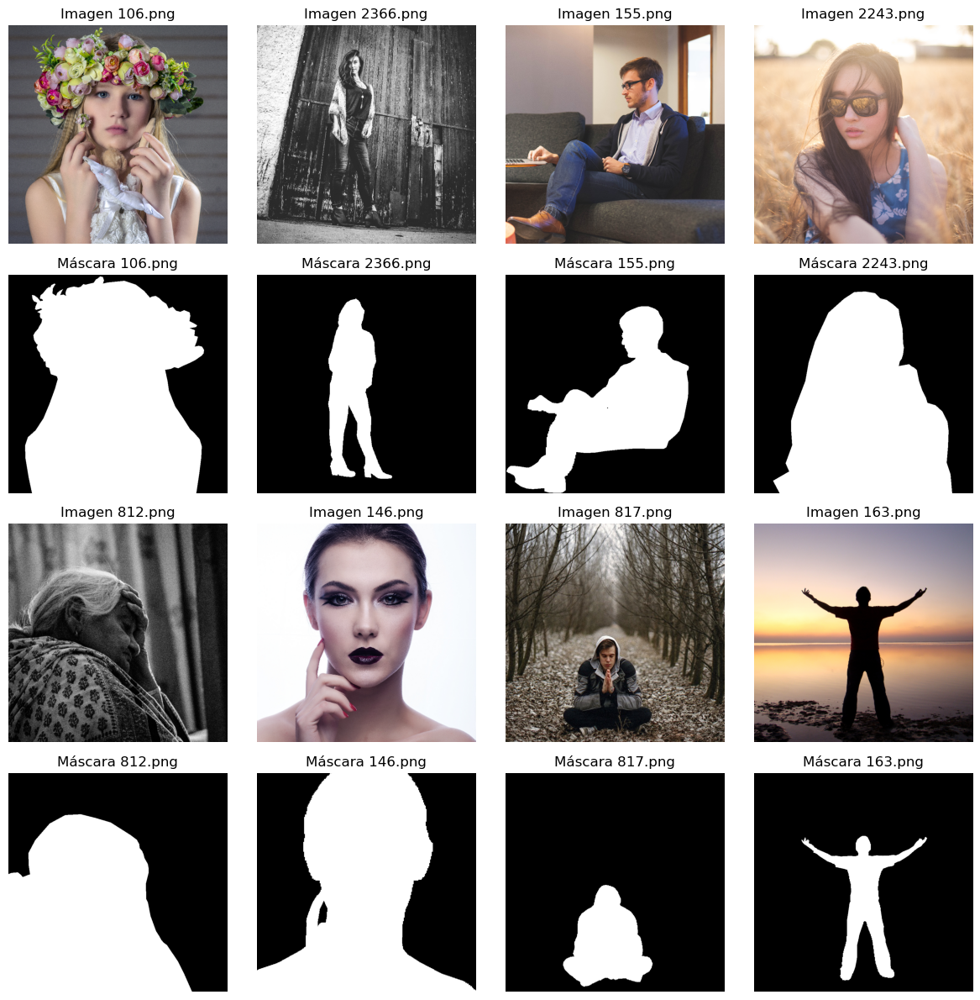

In [ ]:
files = random.sample(os.listdir(IMG_FOLDER), 8)  # 8 imágenes → 4 filas de pares

MASK = None

plt.figure(figsize=(12, 12))
for i, f in enumerate(files):
    img = Image.open(os.path.join(IMG_FOLDER, f))
    mask_path = os.path.join(MASK_FOLDER, f)
    mask = np.array(Image.open(mask_path))
    print(mask.ndim,mask.shape)
    if mask.ndim == 3:
        mask = mask.max(axis=2)

    MASK = mask

    # Fila 1 y 3: imágenes (i=0..3 e i=4..7)
    if i < 4:
        plt.subplot(4, 4, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Imagen {f}")
        plt.subplot(4, 4, i + 1 + 4)
        plt.imshow(mask, cmap="gray", vmin=0, vmax=1)
        plt.axis("off")
        plt.title(f"Máscara {f}")
    else:
        j = i - 4
        plt.subplot(4, 4, j + 1 + 8)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Imagen {f}")
        plt.subplot(4, 4, j + 1 + 12)
        plt.imshow(mask, cmap="gray", vmin=0, vmax=1)
        plt.axis("off")
        plt.title(f"Máscara {f}")

plt.tight_layout()
plt.show()


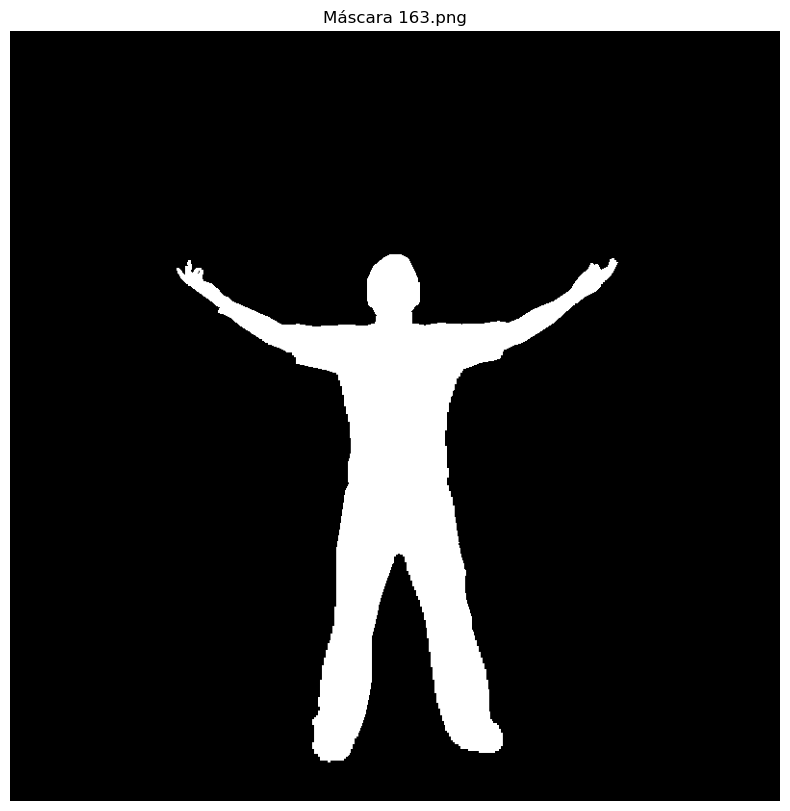

INFORMACIÓN DE LA MATRIZ DE PÍXELES
Forma de la matriz (shape): (800, 800)
Dimensiones de la matriz: 2
Tipo de datos (dtype): uint8
Valor mínimo: 0
Valor máximo: 1
Valor promedio: 0.0959
Valores únicos: [0 1]

Primeros 20x20 píxeles de la matriz:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

Últimos 20x20 píxeles de la matriz:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
# quiero mostrar una mascara y su matriz de pixeles
plt.figure(figsize=(10, 10))
plt.imshow(MASK, cmap="gray", vmin=0, vmax=1)
plt.axis("off")
plt.title(f"Máscara {f}")
plt.show()

# Mostrar información sobre la matriz de píxeles
print("=" * 60)
print("INFORMACIÓN DE LA MATRIZ DE PÍXELES")
print("=" * 60)
print(f"Forma de la matriz (shape): {MASK.shape}")
# dim
print(f"Dimensiones de la matriz: {MASK.ndim}")
print(f"Tipo de datos (dtype): {MASK.dtype}")
print(f"Valor mínimo: {MASK.min()}")
print(f"Valor máximo: {MASK.max()}")
print(f"Valor promedio: {MASK.mean():.4f}")
print(f"Valores únicos: {np.unique(MASK)}")
print(f"\nPrimeros 20x20 píxeles de la matriz:")
print(MASK[:50, :50])
print(f"\nÚltimos 20x20 píxeles de la matriz:")
print(MASK[-50:, -50:])


## Ver tamaños de imágenes y máscaras

In [ ]:
sizes = set()
for fname in os.listdir(IMG_FOLDER):
    if 'png' in fname:
        path = os.path.join(IMG_FOLDER, fname)
        with Image.open(path) as img:
            sizes.add(img.size)

print("Tamaño de imagenes:")
for size in sizes:
    print(size)

sizes = set()
for fname in os.listdir(MASK_FOLDER):
    if 'png' in fname:
        path = os.path.join(MASK_FOLDER, fname)
        with Image.open(path) as img:
            sizes.add(img.size)

print("Tamaño de máscaras:")
for size in sizes:
    print(size)

Tamaño de imagenes:
(800, 800)
Tamaño de máscaras:
(800, 800)


Confirmamos que todas las imágenes y las máscaras tienen el mismo tamaño.

## Buscar duplicados

In [ ]:
def md5_file(path: Path):
    with path.open("rb") as f:
        return hashlib.md5(f.read()).hexdigest()

hashes = {}
duplicates = []

folder = Path(IMG_FOLDER)

for path in folder.iterdir():
    if path.is_file():
        h = md5_file(path)
        if h in hashes:
            duplicates.append((str(path), str(hashes[h])))
        else:
            hashes[h] = path

print(f"Encontradas {len(duplicates)} imágenes duplicadas.")

Encontradas 0 imágenes duplicadas.


## Formato y canales

In [ ]:
img_dir = Path(IMG_FOLDER)
mask_dir = Path(MASK_FOLDER)

img_channel_counts = set()
mask_channel_counts = set()
mask_unique_values = set()

for img_path, mask_path in zip(sorted(img_dir.iterdir()), sorted(mask_dir.iterdir())):
    if img_path.suffix.lower() not in [".jpg", ".png", ".jpeg"]:
        continue

    # Imagen
    # escala de grises: (hight, width) -> 1 canal
    # RGB: (hight, width, channels) = (height, width, 3) -> 3 canales
    # RGBA: (hight, width, 4)
    try:
        img = np.array(Image.open(img_path))
        img_channels = 1 if img.ndim == 2 else img.shape[2]
        img_channel_counts.add(img_channels)

        # Máscara
        mask = np.array(Image.open(mask_path))
        mask_channels = 1 if mask.ndim == 2 else mask.shape[2]
        mask_channel_counts.add(mask_channels)

        # Valores únicos de cada máscara (agrega como tupla)
        mask_unique_values.add(tuple(np.unique(mask)))
    except:
        pass

print(f"Canales únicos en imágenes: {img_channel_counts}")
print(f"Canales únicos en máscaras: {mask_channel_counts}")
print(f"Conjuntos de valores únicos en máscaras: {mask_unique_values}")

Canales únicos en imágenes: {1, 3, 4}
Canales únicos en máscaras: {3}
Conjuntos de valores únicos en máscaras: {(np.uint8(0), np.uint8(1)), (np.uint8(1),)}


Las máscaras son todas RGB pero para para las imágenes tenemos en formato blanco y negro, RGB y RGBA.

EL RGBA es como RGB más informacion de transparencia de la imagen; este 4to canal no nos aporta información util para este problema.

Para que las imagenes tengan todas la misma cantidad de canales a la entrada de la red, decidimos pasarlas todas a RGB porque RGBA no aporta más información y pasarlo a blanco y negro nos hace perder colores e intensidad que podrian ayudar al modelo a distinguir la persona del fondo.

## Mean y STD

In [16]:
paths = [os.path.join(IMG_FOLDER, f) for f in os.listdir(IMG_FOLDER) if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.tif','.tiff'))]

# Función de carga forzada a RGB porque algunas estan en RGBA o blanco y negro (L)
def load_rgb(path):
    im = Image.open(path)
    if im.mode != 'RGB':
        im = im.convert('RGB')
    return im

# Media/STD por canal con acumulacion
sum_c = torch.zeros(3, dtype=torch.float64)
sum_sq_c = torch.zeros(3, dtype=torch.float64)
pix_count_c = torch.zeros(3, dtype=torch.float64)

for p in paths:
    try:
        im = load_rgb(p)
        arr = torch.from_numpy(np.asarray(im))  # H x W x 3, uint8
        t = arr.permute(2,0,1).to(torch.float64) / 255.0  # 3 x H x W , [0,1]

        # acumula por canal suma y suma de los cuadrados
        csum = t.view(3, -1).sum(dim=1)
        csum_sq = (t**2).view(3, -1).sum(dim=1)
        n_pix = torch.tensor([t.shape[1]*t.shape[2]]*3, dtype=torch.float64)

        sum_c += csum
        sum_sq_c += csum_sq
        pix_count_c += n_pix
    except Exception as e:
        pass

MEAN_RGB = (sum_c / pix_count_c).to(torch.float32)
STD_RGB = torch.sqrt((sum_sq_c / pix_count_c) - MEAN_RGB.double()**2).to(torch.float32)

print("mean =", MEAN_RGB.tolist(), "std =", STD_RGB.tolist())

mean = [0.5149781107902527, 0.4839880168437958, 0.4597202241420746] std = [0.31370314955711365, 0.3028314411640167, 0.30339837074279785]


**MEAN:**

Los tres canales tienen valores similares por lo que no hay un color que sea mas dominante que otro.

Los valores estan al rededor del 50% lo que indica que las imagenes tienen una exposicion a la luz pareja.

El rojo aparece un poco mas intenso que los demás.

**STD:**

El STD en este caso mide cuánto varía la intensidad de los pixeles en cada canal.

Por lo que vemos, la variacion para los 3 canales es similar. Un valor de 0.3 nos indica que hay bastante variedad de tonos e intensidades; esto probablemente se deba a que las imagenes tienen zonas claras y oscuras, sombras, piel, ropa, y diversos fondos.

## Histograma de colores en las imágenes

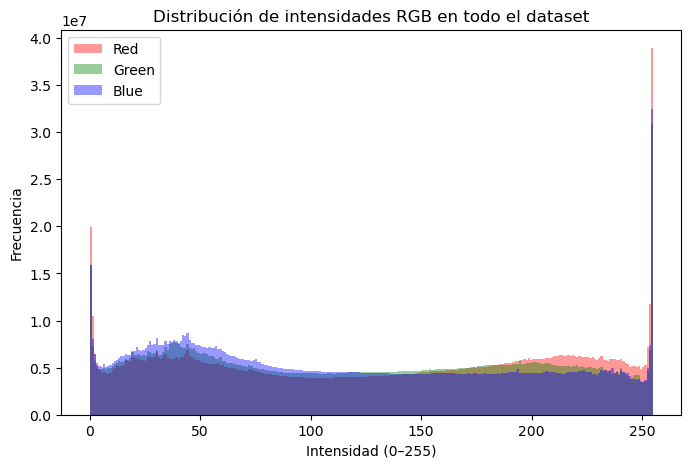

In [ ]:
folder = Path(IMG_FOLDER)

# Acumuladores de cada canal
r_vals, g_vals, b_vals = [], [], []

for p in folder.iterdir():
    if p.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
        continue
    img = np.array(Image.open(p).convert("RGB"))
    # achatar para juntar todos los píxeles
    r, g, b = img[..., 0].ravel(), img[..., 1].ravel(), img[..., 2].ravel()
    r_vals.append(r)
    g_vals.append(g)
    b_vals.append(b)

# concatenar todos los valores
r_vals = np.concatenate(r_vals)
g_vals = np.concatenate(g_vals)
b_vals = np.concatenate(b_vals)

# histograma combinado
plt.figure(figsize=(8,5))
plt.hist(r_vals, bins=256, color='r', alpha=0.4, label='Red')
plt.hist(g_vals, bins=256, color='g', alpha=0.4, label='Green')
plt.hist(b_vals, bins=256, color='b', alpha=0.4, label='Blue')
plt.legend()
plt.title("Distribución de intensidades RGB en todo el dataset")
plt.xlabel("Intensidad (0–255)")
plt.ylabel("Frecuencia")
plt.show()


Los picos en 0 y 255 indican que hay muchos píxeles completamente negros o completamente blancos.

Entre los extremos, vemos que la densidad es relativamente plana, lo que indica amplia variación en los colores.

Las curvas roja, verde y azul son muy similares por lo que vemos que los colores están bastante balanceados en las imagenes del dataset.

## Analizar qué porcentaje de la imagen es ocupado por la persona

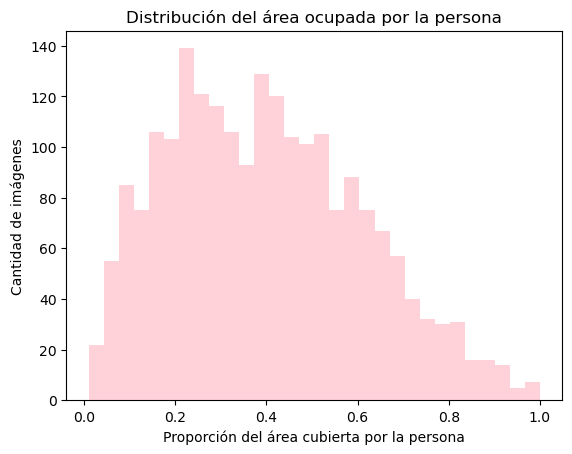

Cobertura promedio: 0.399
Rango: 0.010 – 1.000


In [ ]:
mask_dir = Path(MASK_FOLDER)

coverages = [] # cantidad de pixeles identificados como persona

for p in mask_dir.glob("*.png"):
    mask = np.array(Image.open(p))[:, :, 0]   # un canal, valores {0,1}
    h, w = mask.shape
    coverage = mask.sum() / (h * w)
    coverages.append(coverage)

coverages = np.array(coverages)

plt.hist(coverages, bins=30, color='pink', alpha=0.7)
plt.xlabel("Proporción del área cubierta por la persona") # 0 nada , 1 toda la imagen
plt.ylabel("Cantidad de imágenes")
plt.title("Distribución del área ocupada por la persona")
plt.show()

print(f"Cobertura promedio: {coverages.mean():.3f}")
print(f"Rango: {coverages.min():.3f} – {coverages.max():.3f}")


Podemos ver que en la mayoría de los casos, la persona ocupa el 40% de la imagen, es decir, el 60% de la imagen es el fondo.

Encontradas: 31 imágenes con cobertura <= 0.050


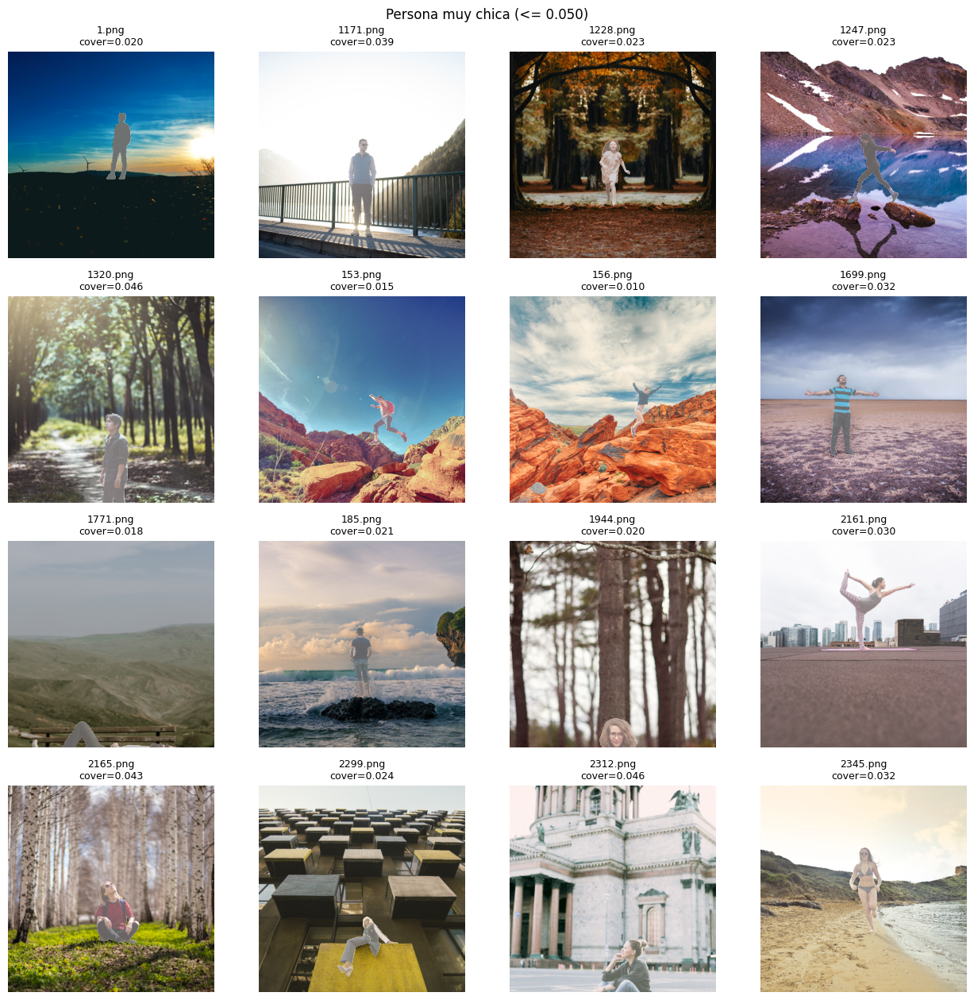

Encontradas: 51 imágenes con cobertura >= 0.850


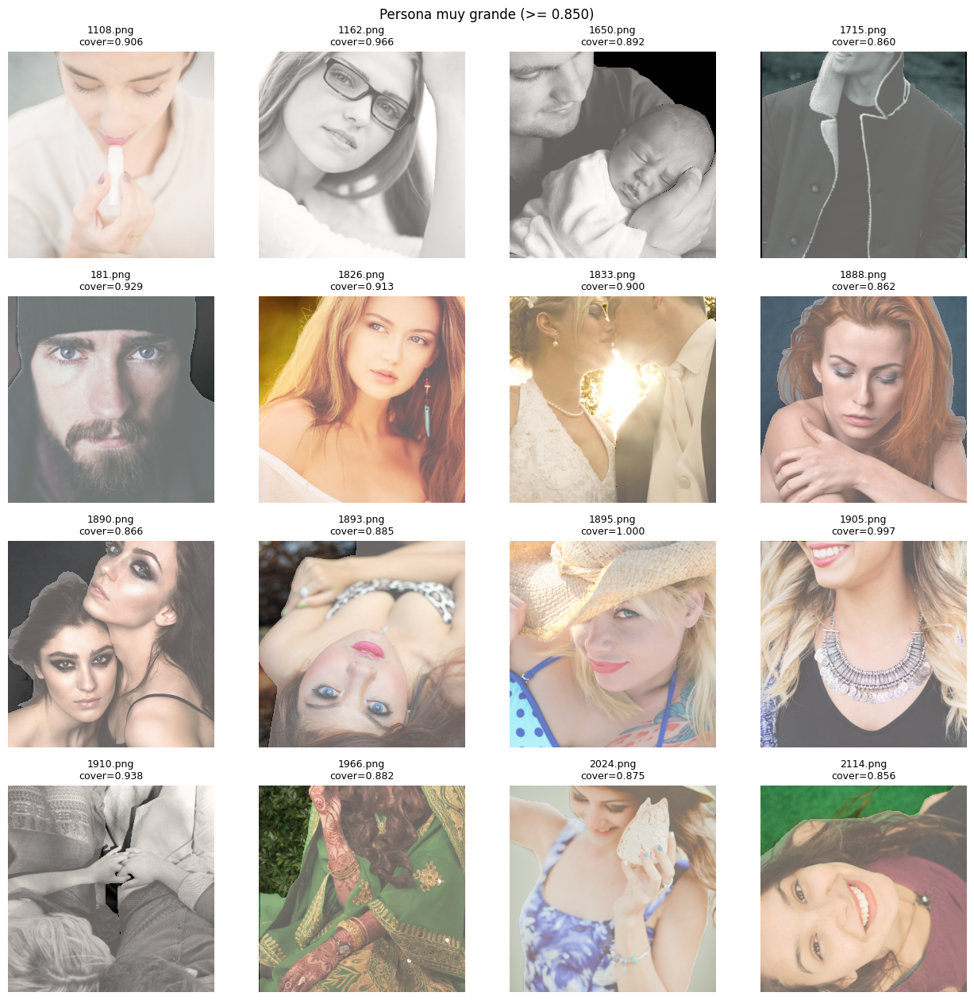

In [14]:
def _read_mask(path):
    m = np.array(Image.open(path))
    if m.ndim == 3:
        m = m[:, :, 0]
    m = (m > 0).astype(np.uint8)
    return m  # HxW en {0,1}

def _read_rgb(path):
    im = Image.open(path)
    if im.mode != "RGB":
        im = im.convert("RGB")
    return np.array(im)      # HxWx3 uint8

def _coverage(mask):
    h, w = mask.shape
    return float(mask.sum()) / float(h * w + 1e-9)

def _build_image_index(image_dir):
    image_dir = Path(image_dir)
    idx = {}
    for p in image_dir.rglob("*"):
        if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}:
            idx[p.stem] = p
    return idx

def _overlay(ax, img, mask, alpha=0.35):
    ax.imshow(img)
    ax.imshow(np.where(mask>0, 1.0, np.nan), cmap="Reds", alpha=alpha, interpolation="nearest")
    ax.axis("off")

# persona muy chica (cobertura <= max_frac)

def find_small_person_with_overlay(mask_dir, image_dir, max_frac=0.10, sample_show=12, cols=4, alpha=0.35):
    mask_dir = Path(mask_dir)
    image_idx = _build_image_index(image_dir)

    matches, fracs = [], []
    paths = sorted([p for p in mask_dir.rglob("*") if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}])

    for mp in paths:
        m = _read_mask(mp)
        f = _coverage(m)
        if f <= max_frac:
            if mp.stem in image_idx:
                matches.append((image_idx[mp.stem], mp))
                fracs.append(f)

    print(f"Encontradas: {len(matches)} imágenes con cobertura <= {max_frac:.3f}")

    if matches:
        k = min(sample_show, len(matches))
        rows = math.ceil(k / cols)
        plt.figure(figsize=(3.2*cols, 3.2*rows))
        for i, (ip, mp) in enumerate(matches[:k]):
            img = _read_rgb(ip); m = _read_mask(mp)
            ax = plt.subplot(rows, cols, i+1)
            _overlay(ax, img, m, alpha=alpha)
            ax.set_title(f"{ip.name}\ncover={_coverage(m):.3f}", fontsize=9)
        plt.suptitle(f"Persona muy chica (<= {max_frac:.3f})")
        plt.tight_layout()
        plt.show()

    return matches, fracs  # lista de (image_path, mask_path), y coberturas


# persona muy grande (cobertura >= min_frac)

def find_large_person_with_overlay(mask_dir, image_dir, min_frac=0.80, sample_show=12, cols=4, alpha=0.35):
    mask_dir = Path(mask_dir)
    image_idx = _build_image_index(image_dir)

    matches, fracs = [], []
    paths = sorted([p for p in mask_dir.rglob("*") if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}])

    for mp in paths:
        m = _read_mask(mp)
        f = _coverage(m)
        if f >= min_frac:
            if mp.stem in image_idx:
                matches.append((image_idx[mp.stem], mp))
                fracs.append(f)

    print(f"Encontradas: {len(matches)} imágenes con cobertura >= {min_frac:.3f}")

    if matches:
        k = min(sample_show, len(matches))
        rows = math.ceil(k / cols)
        plt.figure(figsize=(3.2*cols, 3.2*rows))
        for i, (ip, mp) in enumerate(matches[:k]):
            img = _read_rgb(ip); m = _read_mask(mp)
            ax = plt.subplot(rows, cols, i+1)
            _overlay(ax, img, m, alpha=alpha)
            ax.set_title(f"{ip.name}\ncover={_coverage(m):.3f}", fontsize=9)
        plt.suptitle(f"Persona muy grande (>= {min_frac:.3f})")
        plt.tight_layout()
        plt.show()

    return matches, fracs

# alpha transparencia con la que se superpone imagen y mascara

small, small_fracs = find_small_person_with_overlay(
    mask_dir=MASK_FOLDER, image_dir=IMG_FOLDER,
    max_frac=0.05, sample_show=16, cols=4, alpha=0.4
)

large, large_fracs = find_large_person_with_overlay(
    mask_dir=MASK_FOLDER, image_dir=IMG_FOLDER,
    min_frac=0.85, sample_show=16, cols=4, alpha=0.4
)


## Conclusión de la exploración de datos

El conjunto de datos presenta imagenes y máscaras del mismo tamaño (800×800 px) y sin duplicados.

Las máscaras son todas RGB, mientras que las imágenes originales poseen entre 1, 3 y 4 canales. El canal adicional de las imágenes RGBA corresponde a transparencia, que no aporta información útil para la segmentación; por lo tanto, se decidió convertir todas las imágenes a RGB para unificar la entrada de la red y conservar la información de color relevante. De todas maneras, se probará primero con imagenes de entrada en blanco y negro para ser fieles al paper.

Los valores de MEAN y STD por canal son similares entre sí, confirmando buen balance de colores y bastante variabilidad en intensidades. El histograma de intensidades refuerza estas observaciones, demostrando que el dataset no tiene sesgos de color.

El análisis del espacio ocupado por la persona en la imagen demuestra una ocupación promedio del 40%, con un rango de 0.01 a 1. Esto significa que hay gran variación de escala de personas en las imágenes, donde encontramos tanto primeros planos como imagenes donde la persona está muy chica y es casi todo fondo.

En conclusión, el dataset está balanceado en términos de color y es diverso, lo que es adecuado para entrenar un modelo de segmentación.
Antes del entrenamiento, se deben normalizar las imágenes con los valores calculados de MEAN y STD.

Vamos a probar entrenar con un mínimo de transformaciones para empezar.

Luego veremos si el resultado mejora al aplicar data augmentation, ya que la variabilidad que hay en nuestro dataset ayuda a generalizar pero también hace que sea dificil de aprender.

# Data loaders

El dataset contiene una carpeta train, con imagenes y máscaras, y una carpeta test, solamente con imagenes.

Para poder entrenar y generar métricas, dividiremos la carpeta de train en train/val/test_local con una proporción de 80%/10%/10%.

Definimos la clase SegDataset para generar train/val/test_local manteniendo los pares (imagen, mascara).

In [9]:
def load_image(path, rgb):
        #  "L" convierte a escala de grises
        img = Image.open(path).convert("RGB" if rgb else "L")
        arr = np.array(img, dtype=np.float32) / 255.0  # (H, W, 3) o (H, W)

        if rgb:
            # pasar de (H, W, 3) → (3, H, W)
            arr = np.transpose(arr, (2, 0, 1))
        else:
            # pasar de (H, W) → (1, H, W)
            arr = np.expand_dims(arr, axis=0)

        tensor = torch.from_numpy(arr)
        return tensor

In [10]:
class SegDataset(Dataset):
    """
    Lee pares (imagen, máscara) desde:
      root/images/*.png|jpg...
      root/masks/  con el mismo nombre de archivo
    Devuelve tensores: img -> float32 [0,1], (C,H,W); mask -> long (H,W)
    """
    def __init__(self, root, image_dir="images", mask_dir="masks", transform_img=None, transform_mask=None, rgb=False):
        self.root = Path(root)
        self.images_path = self.root / image_dir
        self.masks_path  = self.root / mask_dir
        self.transform_img = transform_img
        self.transform_mask = transform_mask
        self.rgb = rgb

        # Emparejar por nombre
        img_files = sorted([p for p in self.images_path.iterdir() if p.is_file()])
        names = []
        for p in img_files:
            mask_p = self.masks_path / p.name
            if mask_p.exists():
                names.append(p.name)
        if not names:
            raise RuntimeError(f"No se encontraron pares imagen-máscara en {self.images_path} y {self.masks_path}")

        self.names = names  # lista de nombres emparejados

    def __len__(self):
        return len(self.names)

    def _load_mask(self, path):
        # Máscara como enteros de clase. Si es binaria 0/255, la pasamos a 0/1.
        m = Image.open(path)
        if not self.rgb:
            m = m.convert("L")

        arr = np.array(m)
        if arr.dtype != np.uint8:
            arr = arr.astype(np.uint8)
        # binarizar si viene 0/255
        if arr.max() == 255 and arr.min() in (0, 255):
            arr = (arr > 0).astype(np.uint8)
        tensor = torch.from_numpy(arr.astype(np.int64))  # (H,W) long
        return tensor

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path  = self.images_path / name
        mask_path = self.masks_path  / name

        img  = load_image(img_path, self.rgb)
        mask = self._load_mask(mask_path)

        # Transforms opcionales (independientes para img y mask)
        if self.transform_img:
            img = self.transform_img(img)
        if self.transform_mask:
            mask = self.transform_mask(mask)

        return img, mask


In [11]:
import torchvision.transforms.functional as TF

class SegDatasetRGB(Dataset):
    """
    Lee pares (imagen, máscara) desde:
      root/images/*.png|jpg...
      root/masks/  con el mismo nombre de archivo

    Soporta:
      - Imágenes RGB (rgb=True) o escala de grises (rgb=False).
      - Binario con BCE (mask -> float (1,H,W) en {0,1}) si bce=True.
      - Multiclase con CE (mask -> long (H,W)) si bce=False.

    Transforms:
      - transform_img: se aplica a la imagen (PIL o tensor, según tu pipeline).
      - transform_mask: se aplica a la máscara (usar nearest si hay resize).
    """
    def __init__(self, root, image_dir="images", mask_dir="masks",
                 transform_img=None, transform_mask=None,
                 rgb=True, bce=True):
        self.root = Path(root)
        self.images_path = self.root / image_dir
        self.masks_path  = self.root / mask_dir
        self.transform_img = transform_img
        self.transform_mask = transform_mask
        self.rgb = rgb          # True -> RGB (3 canales), False -> L (1 canal)
        self.bce = bce          # True -> binario+BCE, False -> multiclase+CE

        img_files = sorted([p for p in self.images_path.iterdir() if p.is_file()])
        names = []
        for p in img_files:
            if (self.masks_path / p.name).exists():
                names.append(p.name)
        if not names:
            raise RuntimeError(f"No se encontraron pares imagen-máscara en {self.images_path} y {self.masks_path}")
        self.names = names

    def __len__(self):
        return len(self.names)

    def _load_image(self, path):
        im = Image.open(path)
        im = im.convert("RGB") if self.rgb else im.convert("L")  # decide 3c vs 1c
        # Si no hay transform, convertimos a tensor [0,1] por defecto
        x = self.transform_img(im) if self.transform_img is not None else T.ToImage()(im)
        return x  # (C,H,W) con C=3 si rgb else C=1

    def _load_mask(self, path):
        m = Image.open(path).convert("RGB")  # vienen RGB en el dataset
        arr = np.array(m)  # (H,W,3) uint8 esperado

        if self.bce:
            # Binario: cualquier pixel != fondo es 1
            # (fondo negro)
            bin_hw = (arr.max(axis=2) > 0).astype(np.float32)  # (H,W) {0,1}
            t = torch.from_numpy(bin_hw).unsqueeze(0)  # (1,H,W)
            # Transform opcional para máscara
            if self.transform_mask is not None:
                t = self.transform_mask(t)
            # Asegurar dtype/shape finales para BCE
            t = t.float()
            if t.dim() == 3 and t.shape[0] != 1:
                # si algún transform cambió canales, colapsar a 1 con max (defensivo)
                t = t.max(dim=0, keepdim=True).values
            return t  # (1,H,W) float
        else:
            # Multiclase
            # Como placeholder: colapsamos a 0/1 y devolvemos long (H,W)
            cls_hw = (arr.max(axis=2) > 0).astype(np.int64)  # (H,W)
            t = torch.from_numpy(cls_hw)
            if self.transform_mask is not None:
                t = self.transform_mask(t)
            return t.long()  # (H,W)

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path  = self.images_path / name
        mask_path = self.masks_path  / name

        x = self._load_image(img_path)
        y = self._load_mask(mask_path)

        return x, y


In [12]:
class TestSegmentationDataset(Dataset):
    """
    Lee solo imágenes desde root/images y devuelve (tensor_imagen, nombre_archivo).
    No busca máscaras.
    """
    def __init__(self, image_dir=TEST_FOLDER, transform=None, rgb=False):
        self.images_path = Path(image_dir)
        self.transform = transform
        self.rgb = rgb

        self.names = sorted([p.name for p in self.images_path.iterdir() if p.is_file()])

    def __len__(self):
        return len(self.names)

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path = self.images_path / name

        x = load_image(img_path, self.rgb)

        if self.transform:
            x = self.transform(x)

        return x, name


In [104]:
def get_seg_dataloaders(
    root,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    seed=SEED,
    rgb=False,
    train_transform_img=None,
    train_transform_mask=None,
    val_transform_img=None,
    val_transform_mask=None
):
    """
    Genera tres DataLoaders (train, val, test) a partir de un dataset generado con la clase SegDataset.

    Parámetros
    ----------
    root : str o Path
        Ruta a la carpeta que contiene 'images' y 'masks'.
        Ejemplo: "data/train"
    batch_size
    num_workers
    seed
    rgb : bool, opcional
        Si es True, las imágenes se cargan en RGB; si es False, en escala de grises.
    train_transform_img
    train_transform_mask
    val_transform_img
    val_transform_mask

    Retorna
    -------
    train_loader : Dataloader del conjunto de entrenamiento (80% de los datos).
    val_loader : Dataloader del conjunto de validación (10% de los datos).
    test_loader : Dataloader del conjunto de test (10% de los datos).
    """
    # dataset completo
    full_ds = SegDataset(root=root, rgb=rgb, transform_img=None, transform_mask=None)

    n = len(full_ds)
    n_train = int(0.8 * n)
    n_val   = int(0.1 * n)
    n_test  = n - n_train - n_val

    # sacamos los indices de los (image,mask) que van a ir a cada dataloader
    g = torch.Generator().manual_seed(seed)
    train_idxs, val_idxs, test_idxs = random_split(full_ds, [n_train, n_val, n_test], generator=g)

    if rgb:
        train_ds = SegDatasetRGB(root=root, rgb=rgb, bce=True,
                              transform_img=train_transform_img,
                              transform_mask=train_transform_mask)
    
        val_ds = SegDatasetRGB(root=root, rgb=rgb, bce=True,
                            transform_img=val_transform_img,
                            transform_mask=val_transform_mask)
    
        test_ds = SegDatasetRGB(root=root, rgb=rgb, bce=True,
                             transform_img=val_transform_img,
                             transform_mask=val_transform_mask)
    else:
        train_ds = SegDataset(root=root, rgb=rgb,
                              transform_img=train_transform_img,
                              transform_mask=train_transform_mask)
    
        val_ds = SegDataset(root=root, rgb=rgb,
                            transform_img=val_transform_img,
                            transform_mask=val_transform_mask)
    
        test_ds = SegDataset(root=root, rgb=rgb,
                             transform_img=val_transform_img,
                             transform_mask=val_transform_mask)
        
    test_ds_kaggle = TestSegmentationDataset(transform=val_transform_img, rgb=rgb)

    # Subset usando los índices del split original
    train_ds = Subset(train_ds, train_idxs.indices)
    val_ds   = Subset(val_ds, val_idxs.indices)
    test_ds  = Subset(test_ds, test_idxs.indices)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader  = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    kaggle_loader = DataLoader(test_ds_kaggle, batch_size=batch_size, shuffle=False, num_workers=num_workers) # batch size 1 PROBAR TODO:


    return train_loader, val_loader, test_loader, kaggle_loader

# Transforms

In [14]:
# Re calculamos MEAN y STD para imagenes en blanco y negro.
imgs = []
for p in Path(IMG_FOLDER).iterdir():
    img = Image.open(p).convert("L")
    arr = np.array(img, dtype=np.float32) / 255.0
    imgs.append(arr)

arr = np.stack(imgs)
MEAN_BYN = arr.mean()
STD_BYN = arr.std()

print(f"Mean: {MEAN_BYN} ; STD: {STD_BYN}")

Mean: 0.4904860854148865 ; STD: 0.2986582815647125


In [127]:
train_transform_img_simple = T.Compose(
    [
        T.ToImage(), 
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToDtype(torch.float32, scale=True), 
        T.Normalize(mean=(float(MEAN_BYN),), std=(float(STD_BYN),)),
    ]
)

train_transform_img_rgb = T.Compose(
    [
        T.ToImage(), 
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToDtype(torch.float32, scale=True), 
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)

train_transform_mask_simple = None

train_transform_mask_rgb = None


val_transform_img_simple = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToDtype(torch.float32, scale=True),        
        T.Normalize(mean=(float(MEAN_BYN),), std=(float(STD_BYN),)),
    ]
)

val_transform_img_rgb = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToDtype(torch.float32, scale=True),        
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)

val_transform_mask_simple = None

val_transform_mask_rgb = None

# Arquitectura UNet

En el [paper de UNet](https://arxiv.org/pdf/1505.04597) se define la arquitectura de la red como se muestra en la imagen:


![https://arxiv.org/pdf/1505.04597](assets/UNet_arquitecture.png)

Como entrada a la red tenemos "recortes" de las imagenes originales. Esto se hace asi en el paper porque las imagenes con las que querian entrenar eran demasiado grandes. Estos recortes se ensamblan de nuevo al pasar por el camino de salida.

Las imágenes de entrada son de 1 canal, es decir, en blanco y negro.

Tenemos 4 niveles del lado izquierdo, un cuello de botella al final y luego 4 niveles mas del lado derecho. Éstos se componen de la siguiente manera:

**CONTRACTING PATH (LEFT)**

Conv 3x3 sin padding -> ReLU -> Conv 3x3 sin padding -> ReLU -> Guardar feature map -> MaxPool 2x2 stride 2 -> Aumentar cantidad de canales

Repetir bloque 4 veces.

**BOTTLE NECK**

Conv 3x3 sin padding -> ReLU -> Conv 3x3 sin padding -> ReLU

**EXPANSIVE PATH (RIGHT)**

UpConv 2x2 (reduce a la mitad los canales) -> Recortar feature map del encoder para igualar tamaños y concatenar con el recortado (skip connection) -> Conv 3x3 sin padding -> ReLU -> Conv 3x3 sin padding -> ReLU

Repetir bloque 4 veces.

**SALIDA**

Conv 1x1 (mapear cada pixel del feature map al numero de clases)

<u>Tener en cuenta:</u>

* Si se hace N veces un Max Pool 2x2 => el size de la imagen de entrada debe ser divisible entre 2^N.
* Como se hacen convoluciones sin padding, el size de la imagen de entrada tiene que ser mayor al size de salida deseado.
* Para que al recomponer los "recortes" no aparezcan bordes o espacios, hay que elegir tamaños que respeten tambien el ser divisibles entre 2^N.


# Modelo

Implementaremos la UNet tal y como se la presenta en el paper pero con algunas mejoras.

In [21]:
def center_crop(x, th, tw):
    if x.dim() == 3:  # por torchinfo
        _, h, w = x.shape
        dy = (h - th) // 2
        dx = (w - tw) // 2
        return x[:, dy:dy+th, dx:dx+tw]
    elif x.dim() == 4:
        _, _, h, w = x.shape # tamaño del mapa del encoder
        dy = (h - th) // 2   # recorte superior e inferior
        dx = (w - tw) // 2   # recorte izquierdo y derecho
        return x[:, :, dy:dy+th, dx:dx+tw]


def make_block(in_ch, out_ch, padding=0, use_bn=False, dropout=0.0):
    layers = [nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=padding)]
    if use_bn:
        layers.append(nn.BatchNorm2d(out_ch))
    layers.append(nn.ReLU(inplace=True))
    if dropout > 0.0:
        layers.append(nn.Dropout2d(dropout))
    return nn.Sequential(*layers)


class UNet(nn.Module):
    def __init__(self, n_class, n_channels=1, padding=0, use_bn=False, dropout=0.0):
        super().__init__()

        self.padding = padding

        # ================ ENCODER ================
        self.conv1  = make_block(n_channels, 64,  padding, use_bn, dropout)
        self.conv2  = make_block(64,        64,  padding, use_bn, dropout)
        self.conv3  = make_block(64,        128, padding, use_bn, dropout)
        self.conv4  = make_block(128,       128, padding, use_bn, dropout)
        self.conv5  = make_block(128,       256, padding, use_bn, dropout)
        self.conv6  = make_block(256,       256, padding, use_bn, dropout)
        self.conv7  = make_block(256,       512, padding, use_bn, dropout)
        self.conv8  = make_block(512,       512, padding, use_bn, dropout)

        # ================ BOTTLENECK ================
        self.conv9  = make_block(512,       1024, padding, use_bn, dropout)
        self.conv10 = make_block(1024,      1024, padding, use_bn, dropout)

        # ================ DECODER CONVS ================
        self.conv11 = make_block(1024, 512, padding, use_bn, dropout)  # d4
        self.conv12 = make_block(512,  512, padding, use_bn, dropout)

        self.conv13 = make_block(512,  256, padding, use_bn, dropout)  # d3
        self.conv14 = make_block(256,  256, padding, use_bn, dropout)

        self.conv15 = make_block(256,  128, padding, use_bn, dropout)  # d2
        self.conv16 = make_block(128,  128, padding, use_bn, dropout)

        self.conv17 = make_block(128,   64, padding, use_bn, dropout)  # d1
        self.conv18 = make_block(64,    64, padding, use_bn, dropout)

        # ================ UPCONVS ================
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(512,  256, kernel_size=2, stride=2)
        self.upconv3 = nn.ConvTranspose2d(256,  128, kernel_size=2, stride=2)
        self.upconv4 = nn.ConvTranspose2d(128,   64, kernel_size=2, stride=2)

        self.maxPool = nn.MaxPool2d(2)
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # ================ ENCODER ================
        e1 = self.conv1(x)
        e1 = self.conv2(e1)
        p1 = self.maxPool(e1)

        e2 = self.conv3(p1)
        e2 = self.conv4(e2)
        p2 = self.maxPool(e2)

        e3 = self.conv5(p2)
        e3 = self.conv6(e3)
        p3 = self.maxPool(e3)

        e4 = self.conv7(p3)
        e4 = self.conv8(e4)
        p4 = self.maxPool(e4)

        # ================ BOTTLENECK ================
        b = self.conv9(p4)
        b = self.conv10(b)

        # ================ DECODER ================
        d4 = self.upconv1(b)
        # recorto siempre que sea necesario
        if e4.shape[2:] != d4.shape[2:]:
            e4_ = center_crop(e4, d4.shape[2], d4.shape[3])
        else:
            e4_ = e4
        d4 = torch.cat([e4_, d4], dim=1)
        d4 = self.conv11(d4)
        d4 = self.conv12(d4)

        d3 = self.upconv2(d4)
        if e3.shape[2:] != d3.shape[2:]:
            e3_ = center_crop(e3, d3.shape[2], d3.shape[3])
        else:
            e3_ = e3
        d3 = torch.cat([e3_, d3], dim=1)
        d3 = self.conv13(d3)
        d3 = self.conv14(d3)

        d2 = self.upconv3(d3)
        if e2.shape[2:] != d2.shape[2:]:
            e2_ = center_crop(e2, d2.shape[2], d2.shape[3])
        else:
            e2_ = e2
        d2 = torch.cat([e2_, d2], dim=1)
        d2 = self.conv15(d2)
        d2 = self.conv16(d2)

        d1 = self.upconv4(d2)
        if e1.shape[2:] != d1.shape[2:]:
            e1_ = center_crop(e1, d1.shape[2], d1.shape[3])
        else:
            e1_ = e1
        d1 = torch.cat([e1_, d1], dim=1)
        d1 = self.conv17(d1)
        d1 = self.conv18(d1)

        # ================ OUTPUT ================
        return self.outconv(d1)


In [23]:
model_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True)  # por ejemplo
summary(model_2, input_size=(1, 3, 572, 572)) # input size = batch_size, channels, h, w)

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [1, 1, 560, 560]          --
├─Sequential: 1-1                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-1                       [1, 64, 572, 572]         1,792
│    └─BatchNorm2d: 2-2                  [1, 64, 572, 572]         128
│    └─ReLU: 2-3                         [1, 64, 572, 572]         --
├─Sequential: 1-2                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-4                       [1, 64, 572, 572]         36,928
│    └─BatchNorm2d: 2-5                  [1, 64, 572, 572]         128
│    └─ReLU: 2-6                         [1, 64, 572, 572]         --
├─MaxPool2d: 1-3                         [1, 64, 286, 286]         --
├─Sequential: 1-4                        [1, 128, 286, 286]        --
│    └─Conv2d: 2-7                       [1, 128, 286, 286]        73,856
│    └─BatchNorm2d: 2-8                  [1, 128, 286, 286]        256
│

# Entrenamiento

## Funciones Auxiliares

### Dice Loss

$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$

In [24]:
@torch.no_grad()
def dice_binaria(logits, target, threshold=0.5, eps=1e-7):
    if logits.dim()==3: logits = logits.unsqueeze(1)
    if target.dim()==3: target = target.unsqueeze(1)
    probs = torch.sigmoid(logits)
    preds = (probs >= threshold).float()
    target = (target > 0).float()
    inter = (preds * target).sum(dim=(1,2,3))
    denom = preds.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    dice = torch.where(denom>0, (2*inter+eps)/(denom+eps), torch.ones_like(denom))
    return dice.mean()


In [25]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=0.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        preds = (probs >= 0.5).float()

        if target.dim() == 3:
            target = target.unsqueeze(1)
        target = target.float()

        dice = get_dice(probs, targets, self.smooth)
        diceLoss = 1 - dice
        return diceLoss


In [107]:
############# NUEVA LOSS: Dice + BCEWithLogits #######################################

# Suponiendo que 'targets' y 'logits' tienen forma (Batch, 1, H, W)

# Opcional: Calcula pesos para balancear (e.g., usando la frecuencia inversa)
# Si background es 60% y foreground 40%, podrías usar pos_weight=1.5
# (0.6 / 0.4 = 1.5)
# pos_weight penaliza los Falsos Negativos (importante para foreground).
#pos_weight = torch.tensor(1.5) # Ejemplo de peso
#bce_criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

#bce_loss = bce_criterion(logits, targets)


def dice_loss(pred_logits, target, smooth=1e-6):
    # 1. Aplicar Sigmoide para obtener probabilidades
    pred = torch.sigmoid(pred_logits)

    # Aplanar las dimensiones espaciales para el cálculo (H*W)
    pred = pred.view(-1)
    target = target.view(-1)

    # 2. Calcular la intersección y la suma de las áreas
    # Intersección: P * G (element-wise multiplication)
    intersection = (pred * target).sum()

    # Suma: P + G
    dice_score = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

    # 3. Dice Loss
    return 1 - dice_score

def combined_loss(logits, targets, lambda_dice=0.5, pos_weight=1.5):
    # 1. Definir la BCE Loss (con pesos)
    bce_criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(pos_weight))
    bce_l = bce_criterion(logits, targets)

    # 2. Definir la Dice Loss
    dice_l = dice_loss(logits, targets)

    # 3. Combinar
    total_loss = lambda_dice * dice_l + (1 - lambda_dice) * bce_l
    return total_loss

# Uso en el loop de entrenamiento:
# loss = combined_loss(logits, targets)
# loss.backward()
###########################################################################################


### Model segmentation report
Creamos una nueva funcion para el classification report:

In [26]:
# NCLASSES = 1
@torch.no_grad()
def model_segmentation_report(model, dataloader, device, nclasses, do_confusion_matrix=True, show_dice_loss=True):

    model.eval()
    ys, ps = [], []
    dice_vals = []

    for x, y in dataloader:
        x = x.to(device)
        y = y.to(device)  # y: (N,H,W) long
        logits = model(x)                         # (N,C,h,w)
        logits = F.interpolate(logits, size=y.shape[-2:], mode='bilinear', align_corners=False)

        # Alinear tamaños
        #logits = match_output_dim(logits, y)

        if show_dice_loss and nclasses == 1:
            dice_vals.append(dice_binaria(logits, y).item())

        if nclasses == 1:
            probs = torch.sigmoid(logits)
            pred = (probs >= 0.5).long().squeeze(1)  # (N,h,w)          

        # Aplanar por píxel
        ys.append(y.detach().cpu().numpy().ravel())
        ps.append(pred.detach().cpu().numpy().ravel())

    y_true = np.concatenate(ys, axis=0)
    y_pred = np.concatenate(ps, axis=0)

    labels = [0,1] if nclasses == 1 else list(range(nclasses))
    target_names = ['no-persona','persona'] if nclasses == 1 else [str(i) for i in labels]    

    acc = accuracy_score(y_true, y_pred)
    report = classification_report(
        y_true, y_pred,
        labels=labels,
        target_names=target_names,
        output_dict=True,
        zero_division=0
    )

    if report.get("accuracy") is not None and not isinstance(report["accuracy"], dict):
        report["accuracy"] = {"f1-score": report["accuracy"]}

    if show_dice_loss and nclasses == 1:
        mean_dice = float(np.mean(dice_vals)) if dice_vals else 0.0
        # por clase positiva "1"
        report.setdefault("1", {})["dice"] = mean_dice
        # promedios
        report.setdefault("macro avg", {})["dice"] = mean_dice
        report.setdefault("weighted avg", {})["dice"] = mean_dice

    print(f"Accuracy: {acc:.4f}")
    print_metrics_report(report)

    cm = None
    if do_confusion_matrix:
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        plot_confusion_matrix(cm, title="Confusion matrix")

    return acc, report, cm


## Entrenando UNet original

Entrenamos la UNet con su arquitectura original, respetando padding = 0, batch size = 1 e imágenes de entrada en blanco y negro.

In [36]:
train_loader_1, val_loader_1, test_loader_1, kaggle_loader_1 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)

In [19]:
model_1_2 = UNet(n_class=1).to(DEVICE)
criterion_1_2 = nn.BCEWithLogitsLoss()
optimizer_1_2  = torch.optim.Adam(model_1_2.parameters(), lr=1e-3)

In [20]:
epoch_train_errors_1_2, epoch_val_errors_1_2 = train(model_1_2, optimizer_1_2, criterion_1_2,
                                                 train_loader_1, val_loader_1, DEVICE,
                                                 do_early_stopping=False, epochs=10)

Epoch: 001 | Train Loss: 0.67089 | Val Loss: 0.65126
Epoch: 002 | Train Loss: 0.66320 | Val Loss: 0.66930
Epoch: 003 | Train Loss: 0.66267 | Val Loss: 0.65300
Epoch: 005 | Train Loss: 0.66072 | Val Loss: 0.64517
Epoch: 006 | Train Loss: 0.65963 | Val Loss: 0.65095
Epoch: 007 | Train Loss: 0.65898 | Val Loss: 0.64683
Epoch: 008 | Train Loss: 0.65713 | Val Loss: 0.64503
Epoch: 009 | Train Loss: 0.65806 | Val Loss: 0.64258
Epoch: 010 | Train Loss: 0.65662 | Val Loss: 0.64173


Accuracy: 0.6162
Dice: 0.1217


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.62         0.97         0.75       83232184.0             
persona          0.59         0.07         0.13       53727816.0             
accuracy                                   0.62                              
macro avg         0.6         0.52         0.44      136960000.0     0.12    
weighted avg     0.61         0.62         0.51      136960000.0     0.12    
1                                                                    0.12    



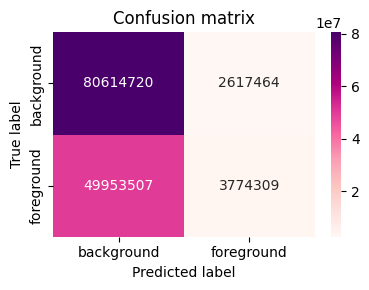

In [21]:
#report_1 = model_classification_report(model_1, test_loader_1, DEVICE, NUM_CLASES)
acc, rep, cm = model_segmentation_report(
    model_1_2, test_loader_1, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)

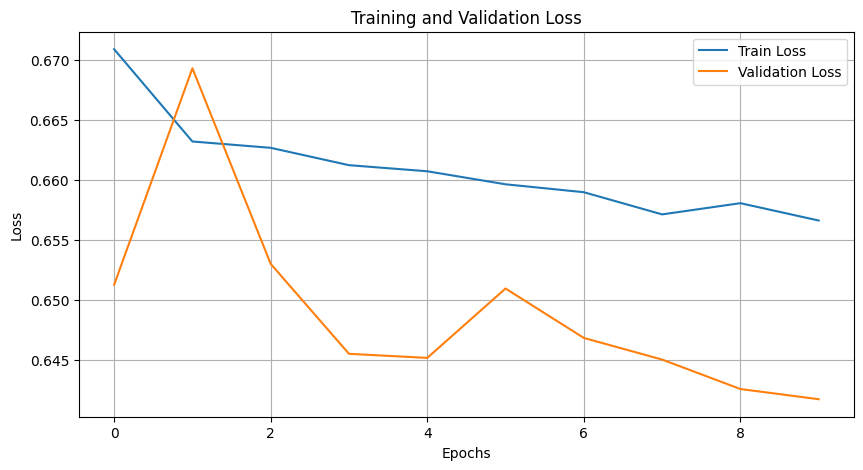

In [22]:
plot_training(epoch_train_errors_1_2, epoch_val_errors_1_2)

In [24]:
predict_and_build_submission(model_1_2, DEVICE, kaggle_loader_1, out_csv="simple_unet_submission")

torch.Size([1, 1, 612, 612])
logits: torch.Size([1, 1, 800, 800])
mask_np shape: (800, 800)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
torch.Size([1, 1, 612, 612])
logits: torch.Size([1, 1, 800, 800])
mask_np shape: (800, 800)
[[0 0 1 1 1 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1]]
torch.Size([1, 1, 612, 612])
logits: torch.Size([1, 1, 800, 800])
mask_np shape: (800, 800)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
torch.Size([1, 1, 612, 612])
logits: torch.Size([1, 1, 800, 800])
mask_np shape: (800, 800)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
torch.Size([1, 1, 612, 612])
logits: torch.Size([1, 1, 800, 800])
mask_np shape: (800, 800)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
torch.Size([1, 1, 612, 612])
logits: torch.Size([1, 1, 800, 800])
mask_np shape: (800, 800)
[[0 0 0 0 0 0

(           id                                     encoded_pixels
 0    1024.png  97 1 205 3 211 10 228 6 291 4 296 4 354 3 358 ...
 1    1025.png  4 3 14 2 22 4 34 2 70 9 83 10 167 3 172 1 231 ...
 2    1027.png  145570 2 146367 4 147165 4 147962 4 148761 3 1...
 3    1037.png  3869 2 4664 5 5460 1 5462 6 6256 5 7054 4 7065...
 4    1038.png  50 3 118 2 215 8 232 4 240 3 265 3 303 2 307 5...
 ..        ...                                                ...
 529   971.png  787 1 792 4 1585 3 1593 1 2383 6 3182 8 3981 9...
 530   975.png  675 7 690 3 697 4 723 5 740 4 745 1 751 6 764 ...
 531   987.png  1 5 15 14 33 4 50 1 52 12 67 8 81 1 94 2 106 3...
 532   995.png  129 1 225 9 243 2 250 2 255 6 268 8 281 9 299 ...
 533   999.png  57673 1 204825 2 205626 1 243849 1 244648 2 24...
 
 [534 rows x 2 columns],
 'submissions/simple_unet_submission_12-11-2025_17:45.csv')

## Entrenando UNet con padding 1

La idea de esto es simplificar la arquitectura manteniendo el tamaño de las imagenes para mantener mas información de la imagen en cada capa y no tener que hacer un resize en la parte del decoder, pudiendo simplemente concatenar los feature maps.

In [138]:
train_loader_pad, val_loader_pad, test_loader_pad, kaggle_loader_pad = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)

In [140]:
unet_pad_1 = UNet(n_class=1, padding=1).to(DEVICE)
criterion_pad_1 = nn.BCEWithLogitsLoss()
optimizer_pad_1  = torch.optim.Adam(unet_pad_1.parameters(), lr=1e-5)

epoch_train_errors_pad_1, epoch_val_errors_pad_1 = train(unet_pad_1, optimizer_pad_1, criterion_pad_1,
                                                 train_loader_pad, val_loader_pad, DEVICE,
                                                 do_early_stopping=True, patience=15, epochs=100, log_every=10)

Epoch: 002 | Train Loss: 0.65953 | Val Loss: 0.62329
Epoch: 010 | Train Loss: 0.50128 | Val Loss: 0.45910
Epoch: 020 | Train Loss: 0.42229 | Val Loss: 0.39328
Epoch: 030 | Train Loss: 0.38674 | Val Loss: 0.36211
Epoch: 040 | Train Loss: 0.35059 | Val Loss: 0.33363
Epoch: 050 | Train Loss: 0.31471 | Val Loss: 0.32260
Epoch: 060 | Train Loss: 0.27657 | Val Loss: 0.31501
Epoch: 070 | Train Loss: 0.22550 | Val Loss: 0.32787
Detener entrenamiento en la época 73, la mejor pérdida fue 0.31364


Accuracy: 0.8695
Dice: 0.7995


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona        0.9         0.89         0.89       83232184.0             
persona          0.83         0.84         0.84       53727816.0             
accuracy                                   0.87                              
macro avg        0.86         0.86         0.86      136960000.0      0.8    
weighted avg     0.87         0.87         0.87      136960000.0      0.8    
1                                                                     0.8    



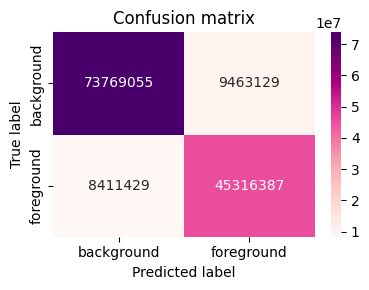

In [141]:
#report_1 = model_classification_report(model_1, test_loader_1, DEVICE, NUM_CLASES)
acc, rep, cm = model_segmentation_report(
    unet_pad_1, test_loader_pad, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

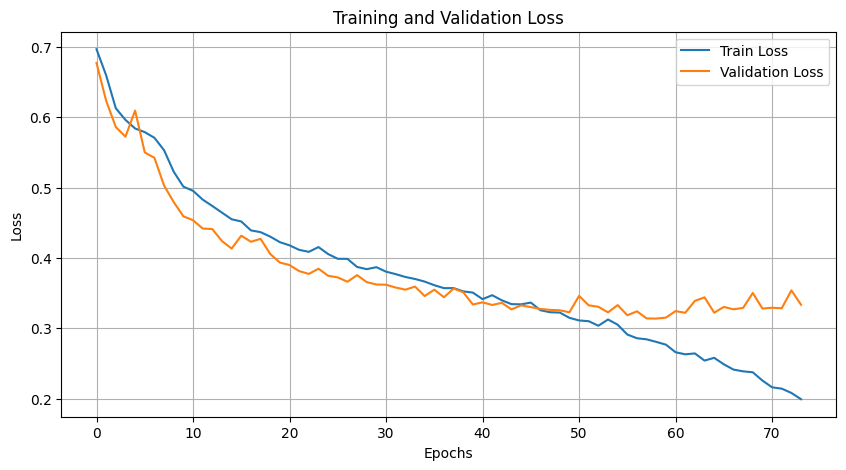

In [142]:
plot_training(epoch_train_errors_pad_1, epoch_val_errors_pad_1)

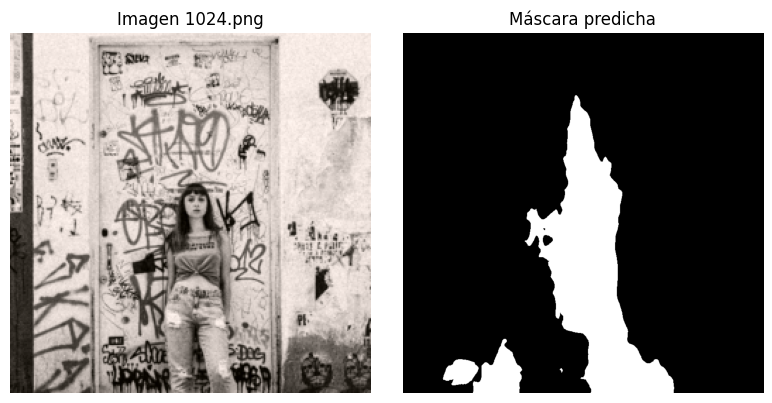

In [147]:
visualizar_test(unet_pad_1, kaggle_loader_pad, DEVICE)

In [148]:
train_loader_pad, val_loader_pad, test_loader_pad, kaggle_loader_pad = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)
predict_and_build_submission(unet_pad_1, DEVICE, kaggle_loader_pad, out_csv="unet_padding_1_submission")

submission guardado como: submissions/unet_padding_1_submission_16-11-2025_20:01.csv


(           id                                     encoded_pixels
 0    1024.png  71168 1 71965 7 72761 11 73559 13 74356 16 751...
 1    1025.png  672 129 1472 129 2270 131 3069 132 3868 133 46...
 2    1027.png  180714 23 181506 38 182300 50 183094 61 183888...
 3    1037.png  5747 14 6545 20 7343 25 8142 33 8209 28 8941 3...
 4    1038.png  27976 3 28774 7 29574 8 30374 9 31173 11 31973...
 ..        ...                                                ...
 529   971.png  103886 1 104682 9 105480 15 106278 20 107077 2...
 530   975.png  5032 8 5827 18 6624 23 7421 29 8218 33 8961 8 ...
 531   987.png  18879 4 19677 11 20476 15 21275 19 22076 19 22...
 532   995.png  344 143 1144 143 1942 147 2741 149 3540 151 43...
 533   999.png  190386 6 191182 13 191979 19 192776 25 193573 ...
 
 [534 rows x 2 columns],
 'submissions/unet_padding_1_submission_16-11-2025_20:01.csv')

## Entrenando UNet con padding 1 + RGB


In [145]:
train_loader_rgb, val_loader_rgb, test_loader_rgb, kaggle_loader_rgb = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [146]:
unet_rgb = UNet(n_class=1, n_channels=3, padding=1).to(DEVICE)
criterion_rgb = nn.BCEWithLogitsLoss()
optimizer_rgb  = torch.optim.Adam(unet_rgb.parameters(), lr=1e-5)
 
epoch_train_errors_rgb, epoch_val_errors_rgb = train(unet_rgb, optimizer_rgb, criterion_rgb,
                                                 train_loader_rgb, val_loader_rgb, DEVICE,
                                                 do_early_stopping=True, patience=15, epochs=300, log_every=20)

Epoch: 002 | Train Loss: 0.65893 | Val Loss: 0.62864
Epoch: 020 | Train Loss: 0.37553 | Val Loss: 0.37538
Epoch: 040 | Train Loss: 0.29874 | Val Loss: 0.34273
Epoch: 060 | Train Loss: 0.22116 | Val Loss: 0.34369
Detener entrenamiento en la época 66, la mejor pérdida fue 0.33036


Accuracy: 0.8711
Dice: 0.7945


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.88         0.91          0.9       83232184.0             
persona          0.85         0.81         0.83       53727816.0             
accuracy                                   0.87                              
macro avg        0.87         0.86         0.86      136960000.0     0.79    
weighted avg     0.87         0.87         0.87      136960000.0     0.79    
1                                                                    0.79    



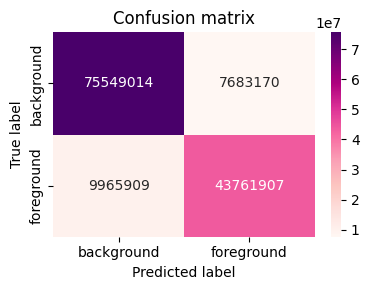

In [149]:
acc, rep, cm = model_segmentation_report(
    unet_rgb, test_loader_rgb, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

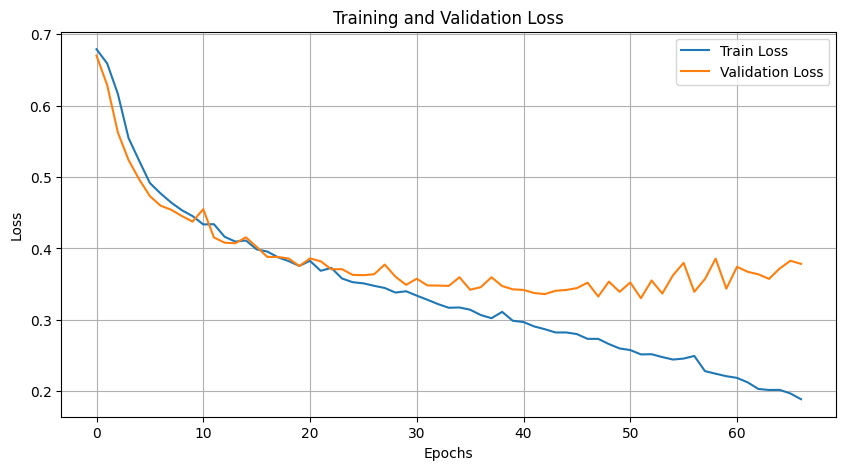

In [150]:
plot_training(epoch_train_errors_rgb, epoch_val_errors_rgb)

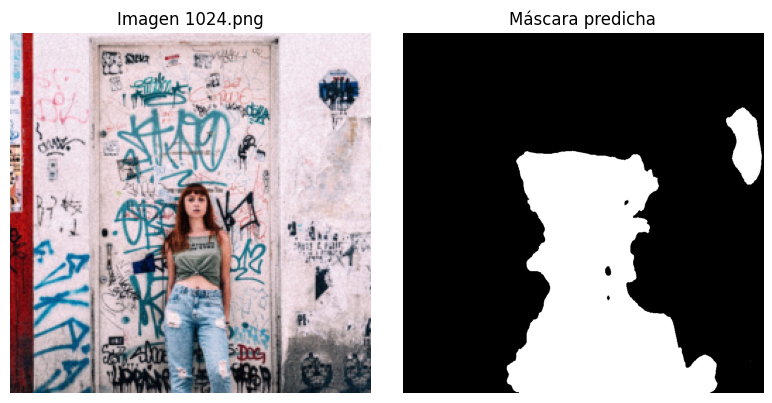

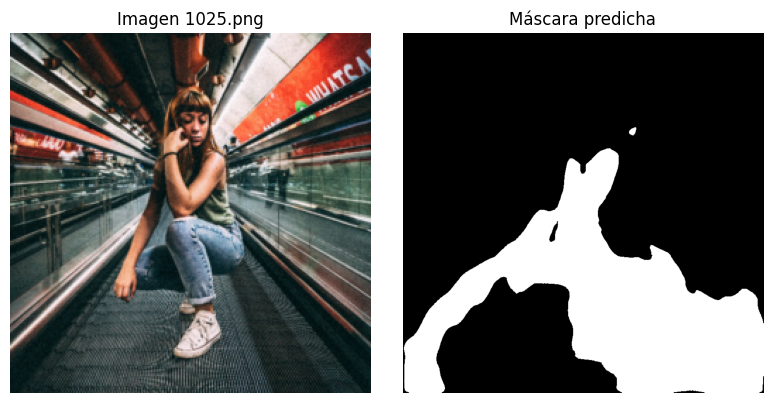

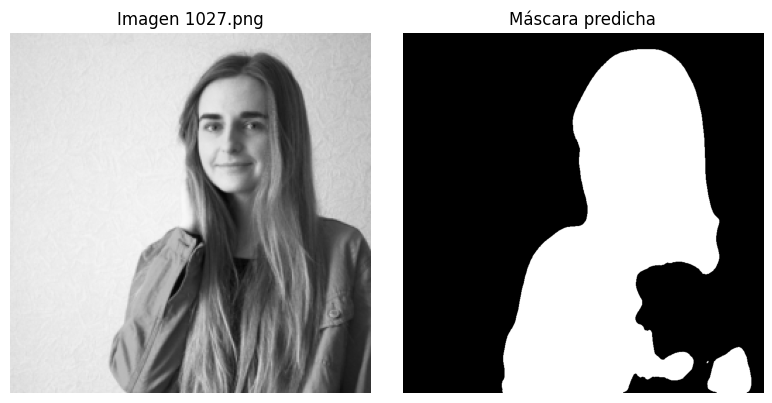

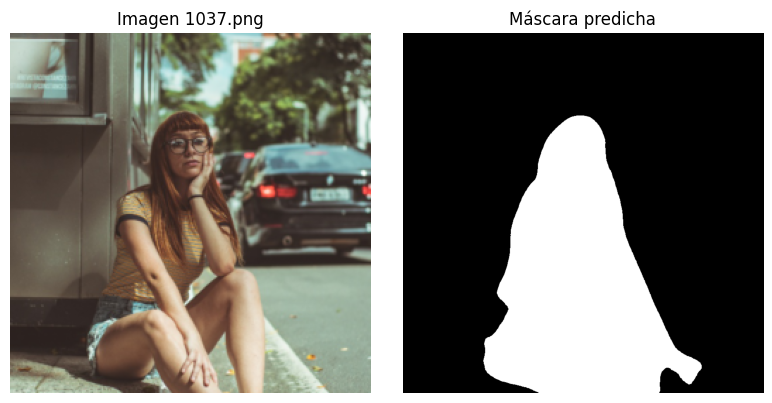

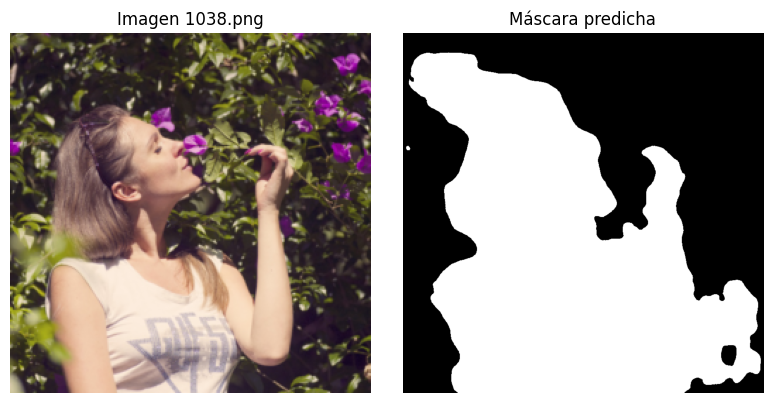

In [151]:
visualizar_test(unet_rgb, kaggle_loader_rgb, DEVICE)

In [152]:
train_loader_rgb, val_loader_rgb, test_loader_rgb, kaggle_loader_rgb = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)
predict_and_build_submission(unet_rgb, DEVICE, kaggle_loader_rgb, out_csv="unet_rgb_submission")

submission guardado como: submissions/unet_rgb_submission_16-11-2025_20:06.csv


(           id                                     encoded_pixels
 0    1024.png  184742 8 184772 4 185540 12 185568 11 186339 1...
 1    1025.png  2299 7 2374 1 3095 16 3136 55 3893 24 3926 69 ...
 2    1027.png  175979 10 176775 18 176794 4 177573 28 178317 ...
 3    1037.png  143127 5 143923 14 144689 6 144719 21 145485 1...
 4    1038.png  5855 5 6654 8 7454 9 8253 10 9053 10 9854 9 10...
 ..        ...                                                ...
 529   971.png  60780 10 61577 14 62376 16 63175 17 63974 19 6...
 530   975.png  7808 6 8600 18 9396 26 10194 30 10992 33 11791...
 531   987.png  2083 9 2880 15 3678 19 4477 21 5276 23 6076 24...
 532   995.png  384567 10 384580 1 385361 33 386155 45 386950 ...
 533   999.png  211095 19 211889 36 212686 46 213483 56 214279...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_submission_16-11-2025_20:06.csv')

### Ahora con batch_norm y dropout

In [153]:
train_loader_rgb_2, val_loader_rgb_2, test_loader_rgb_2, kaggle_loader_rgb_2 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [ ]:
unet_rgb_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3).to(DEVICE)
criterion_rgb_2 = nn.BCEWithLogitsLoss()
optimizer_rgb_2 = torch.optim.Adam(unet_rgb_2.parameters(), lr=1e-5)
 
epoch_train_errors_rgb_2, epoch_val_errors_rgb_2 = train(unet_rgb_2, optimizer_rgb_2, criterion_rgb_2,
                                                 train_loader_rgb_2, val_loader_rgb_2, DEVICE,
                                                 do_early_stopping=True, patience=15, epochs=200, log_every=20)

Accuracy: 0.6549
Dice: 0.2290


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.64         0.99         0.78       83232184.0             
persona          0.89         0.14         0.24       53727816.0             
accuracy                                   0.65                              
macro avg        0.77         0.56         0.51      136960000.0     0.23    
weighted avg     0.74         0.65         0.57      136960000.0     0.23    
1                                                                    0.23    



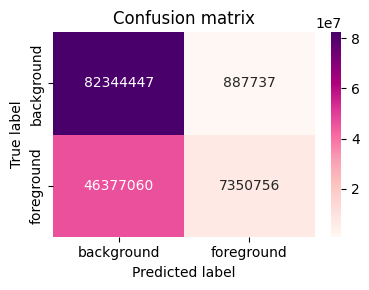

In [37]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_2, test_loader_rgb_2, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

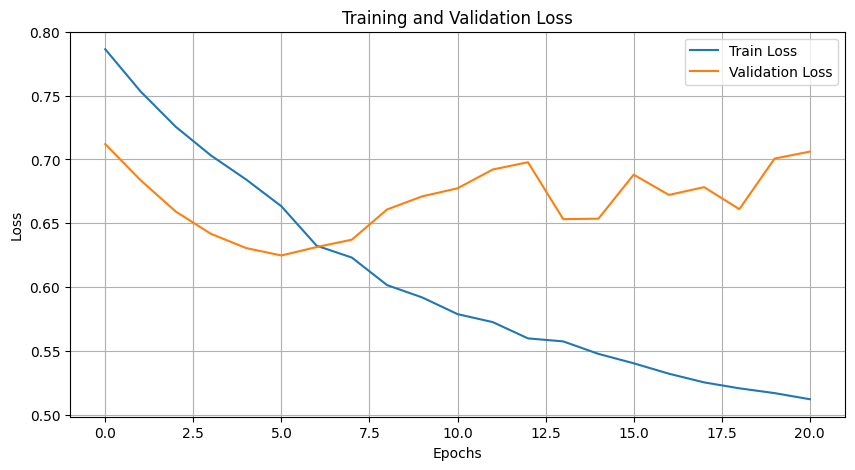

In [39]:
plot_training(epoch_train_errors_rgb_2, epoch_val_errors_rgb_2)

### Ahora solo con dropout

In [106]:
train_loader_rgb_3, val_loader_rgb_3, test_loader_rgb_3, kaggle_loader_rgb_3 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [97]:
unet_rgb_3 = UNet(n_class=1, n_channels=3, padding=1, use_bn=False, dropout=0.3).to(DEVICE)
criterion_rgb_3 = nn.BCEWithLogitsLoss()
optimizer_rgb_3 = torch.optim.Adam(unet_rgb_3.parameters(), lr=1e-5)
 
epoch_train_errors_rgb_3, epoch_val_errors_rgb_3 = train(unet_rgb_3, optimizer_rgb_3, criterion_rgb_3,
                                                 train_loader_rgb_3, val_loader_rgb_3, DEVICE,
                                                 do_early_stopping=True, patience=20, epochs=200, log_every=10)

Epoch: 002 | Train Loss: 0.67884 | Val Loss: 0.65027
Epoch: 010 | Train Loss: 0.58068 | Val Loss: 0.54558
Epoch: 020 | Train Loss: 0.51511 | Val Loss: 0.48234
Epoch: 030 | Train Loss: 0.49117 | Val Loss: 0.44676
Epoch: 040 | Train Loss: 0.47317 | Val Loss: 0.42975
Epoch: 050 | Train Loss: 0.46346 | Val Loss: 0.41594
Epoch: 060 | Train Loss: 0.44630 | Val Loss: 0.41200
Epoch: 070 | Train Loss: 0.43730 | Val Loss: 0.40441
Epoch: 080 | Train Loss: 0.42793 | Val Loss: 0.39077
Epoch: 090 | Train Loss: 0.41776 | Val Loss: 0.39173
Epoch: 100 | Train Loss: 0.41201 | Val Loss: 0.37831
Epoch: 110 | Train Loss: 0.40154 | Val Loss: 0.38920
Epoch: 120 | Train Loss: 0.39462 | Val Loss: 0.37625
Epoch: 130 | Train Loss: 0.38307 | Val Loss: 0.38390
Epoch: 140 | Train Loss: 0.37862 | Val Loss: 0.36460
Epoch: 150 | Train Loss: 0.36926 | Val Loss: 0.36432
Epoch: 160 | Train Loss: 0.36266 | Val Loss: 0.35601
Epoch: 170 | Train Loss: 0.35425 | Val Loss: 0.36269
Epoch: 180 | Train Loss: 0.34967 | Val Loss: 0

Accuracy: 0.8578
Dice: 0.7926


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona        0.9         0.86         0.88       83232184.0             
persona           0.8         0.86         0.83       53727816.0             
accuracy                                   0.86                              
macro avg        0.85         0.86         0.85      136960000.0     0.79    
weighted avg     0.86         0.86         0.86      136960000.0     0.79    
1                                                                    0.79    



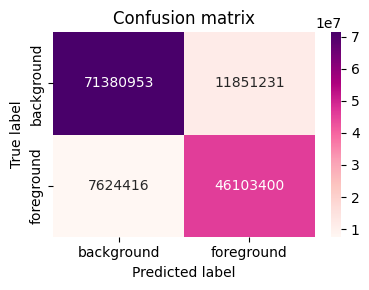

In [98]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_3, test_loader_rgb_3, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

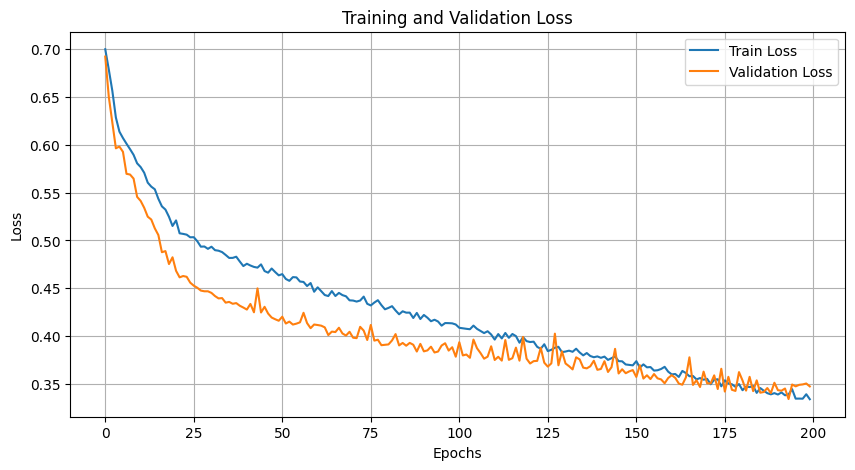

In [99]:
plot_training(epoch_train_errors_rgb_3, epoch_val_errors_rgb_3)

In [102]:
def denormalize(img, mean=MEAN_RGB, std=STD_RGB):
    """
    img: tensor (C,H,W) normalizado
    devuelve tensor (C,H,W) en [0,1] aprox
    """
    mean = torch.tensor(mean).view(-1, 1, 1)
    std  = torch.tensor(std).view(-1, 1, 1)
    return img * std + mean
    
@torch.no_grad()
def visualizar_test(model, loader, device, n=5, threshold=0.5):
    model.eval()
    imgs, names = next(iter(loader))      # aquí el loader da (x, name)
    imgs = imgs.to(device)

    logits = model(imgs)
    logits = match_output_to_dim(logits)  # misma función que en utils.py
    probs  = torch.sigmoid(logits)
    preds  = (probs > threshold).float()

    B = imgs.size(0)
    n = min(n, B)

    for i in range(n):
        img_vis = denormalize(imgs[i].cpu()).clamp(0,1).permute(1,2,0)
        pred    = preds[i].cpu().squeeze()

        fig, axs = plt.subplots(1, 2, figsize=(8, 4))
        axs[0].imshow(img_vis)
        axs[0].set_title(f"Imagen {names[i]}")
        axs[0].axis("off")

        axs[1].imshow(pred, cmap="gray")
        axs[1].set_title("Máscara predicha")
        axs[1].axis("off")
        plt.tight_layout()
        plt.show()



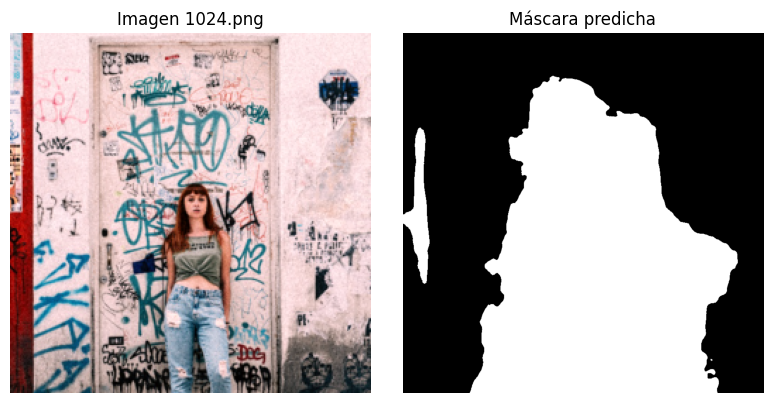

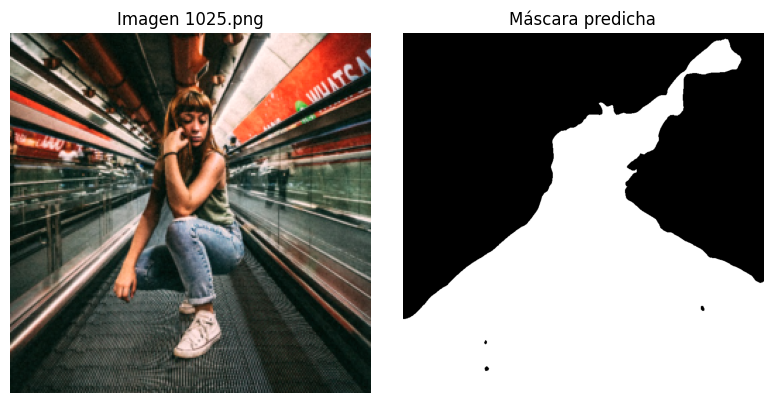

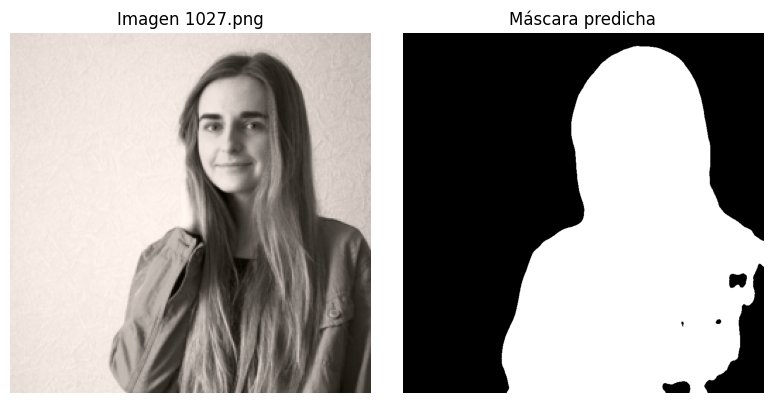

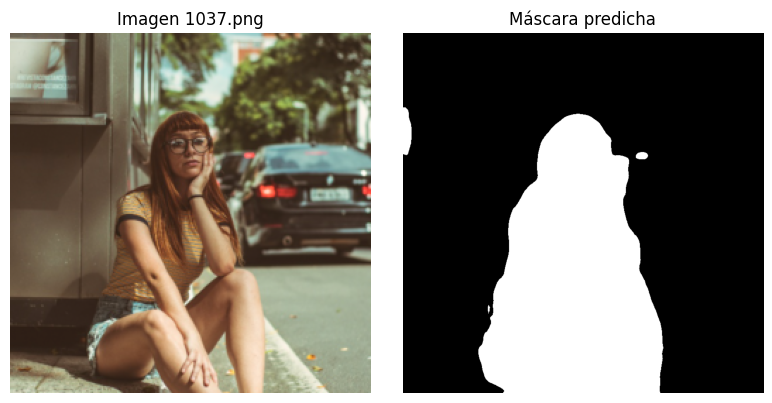

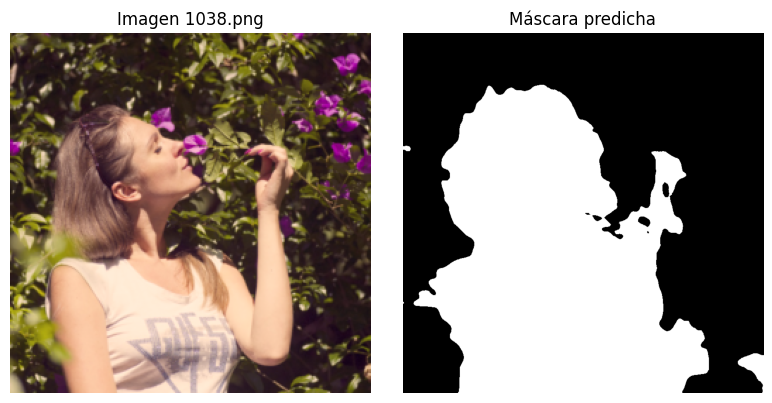

In [105]:
train_loader_rgb_3, val_loader_rgb_3, test_loader_rgb_3, kaggle_loader_rgb_3 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)
visualizar_test(unet_rgb_3, kaggle_loader_rgb_3, DEVICE)

In [101]:
predict_and_build_submission(unet_rgb_3, DEVICE, kaggle_loader_rgb_3, out_csv="unet_rgb_s3_ubmission")

submission guardado como: submissions/unet_rgb_s3_ubmission_16-11-2025_11:10.csv


(           id                                     encoded_pixels
 0    1024.png  405 21 1205 21 2005 22 2804 23 3604 24 4402 27...
 1    1025.png  637 164 1437 164 2237 164 3037 164 3837 164 46...
 2    1027.png  175124 1 175912 25 176704 37 177497 46 178292 ...
 3    1037.png  168 104 968 104 1768 104 2568 105 3368 105 416...
 4    1038.png  254 8 599 4 1054 8 1399 4 1854 8 2654 8 3454 9...
 ..        ...                                                ...
 529   971.png  85513 6 86292 7 86309 13 87091 10 87106 19 878...
 530   975.png  111002 5 111801 8 112601 9 113402 9 114202 10 ...
 531   987.png  465 44 547 138 1265 44 1347 138 2065 44 2148 1...
 532   995.png  21210 2 22002 13 22800 16 23599 18 24397 21 25...
 533   999.png  795 6 1595 6 2395 6 3195 6 3995 6 4794 7 5594 ...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_s3_ubmission_16-11-2025_11:10.csv')

## Entrenando UNet con padding 1 + ByN usando Dice + BCE para el cálculo de la función de pérdida.


In [115]:
train_loader_dice, val_loader_dice, test_loader_dice, kaggle_loader_dice = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)

In [117]:
unet_dice = UNet(n_class=1, padding=1).to(DEVICE)
criterion_dice = combined_loss
optimizer_dice  = torch.optim.Adam(unet_dice.parameters(), lr=1e-3)

epoch_train_errors_dice, epoch_val_errors_dice = train(unet_dice, optimizer_dice, criterion_dice,
                                                 train_loader_dice, val_loader_dice, DEVICE,
                                                 do_early_stopping=True, patience=20, epochs=300, log_every=10)

Epoch: 002 | Train Loss: 0.80819 | Val Loss: 0.65487
Epoch: 010 | Train Loss: 0.56793 | Val Loss: 0.55480
Epoch: 020 | Train Loss: 2.48733 | Val Loss: 0.66858
Epoch: 030 | Train Loss: 0.57444 | Val Loss: 0.54144
Detener entrenamiento en la época 37, la mejor pérdida fue 0.46443


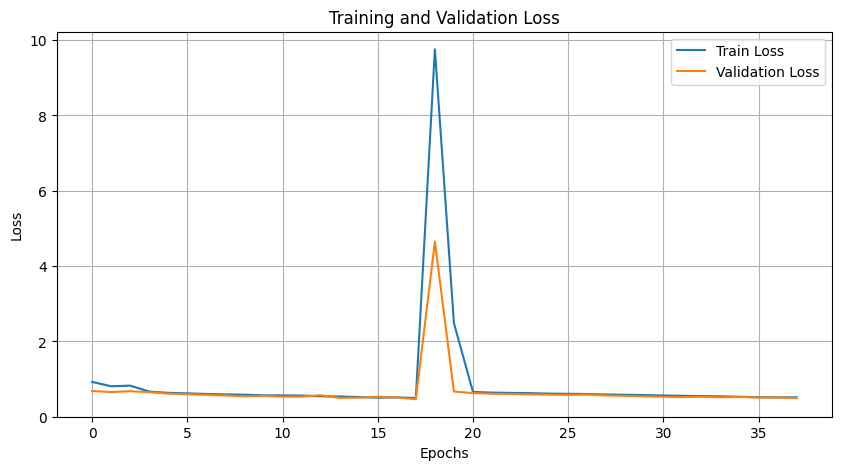

In [118]:
plot_training(epoch_train_errors_dice, epoch_val_errors_dice)

Accuracy: 0.7496
Dice: 0.6764


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.83         0.74         0.78       83232184.0             
persona          0.65         0.77         0.71       53727816.0             
accuracy                                   0.75                              
macro avg        0.74         0.75         0.74      136960000.0     0.68    
weighted avg     0.76         0.75         0.75      136960000.0     0.68    
1                                                                    0.68    



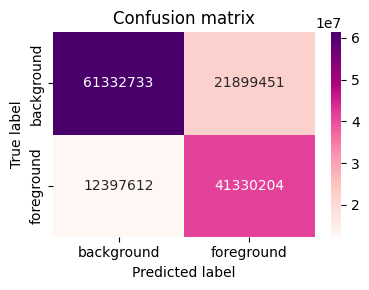

In [119]:
acc, rep, cm = model_segmentation_report(
    unet_dice, test_loader_dice, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

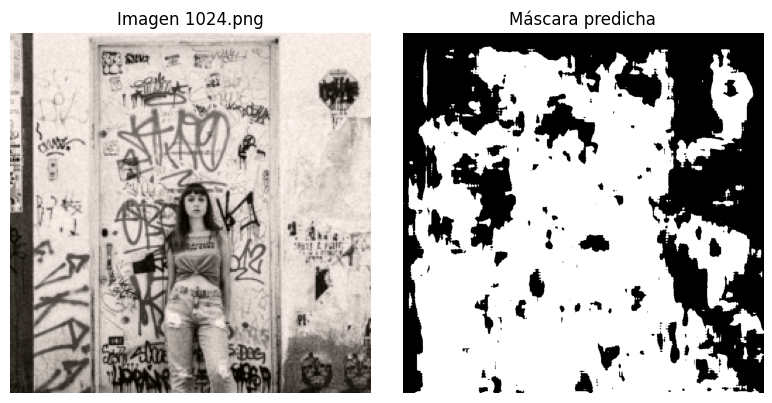

In [120]:
train_loader_dice, val_loader_dice, test_loader_dice, kaggle_loader_dice = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)
visualizar_test(unet_dice, kaggle_loader_dice, DEVICE)

In [ ]:
predict_and_build_submission(unet_dice, DEVICE, kaggle_loader_dice, out_csv="unet_dice_submission")

torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np shape: (800, 800)
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np shape: (800, 800)
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np shape: (800, 800)
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np shape: (800, 800)
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np shape: (800, 800)
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np shape: (800, 800)
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np shape: (800, 800)
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
torch.Size([1, 2, 800, 800])
logits: torch.Size([1, 2, 800, 800])
mask_np sh

(           id encoded_pixels
 0    1024.png       1 640000
 1    1025.png       1 640000
 2    1027.png       1 640000
 3    1037.png       1 640000
 4    1038.png       1 640000
 ..        ...            ...
 529   971.png       1 640000
 530   975.png       1 640000
 531   987.png       1 640000
 532   995.png       1 640000
 533   999.png       1 640000
 
 [534 rows x 2 columns],
 'submissions/unet_dice_submission_11-11-2025_17:31.csv')

## Entrenando UNet con padding 1 + RGB usando Dice + BCE para el cálculo de la función de pérdida.

In [ ]:
train_loader_dice_rgb, val_loader_dice_rgb, test_loader_dice_rgb, kaggle_loader_dice_rgb = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

# ===============================================================================================
# ===============================================================================================

## Entreneando UNet con padding 1 + BInary Deci loss


In [ ]:
import torch
import torch.nn as nn

class BinaryDiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        """
        logits: Tensor (B, 1, H, W) — salida del modelo (sin sigmoid)
        targets: Tensor (B, H, W) o (B, 1, H, W) — máscara binaria {0,1}
        """
        # Asegurar que los targets tengan misma forma que logits
        if targets.ndim == 3:
            targets = targets.unsqueeze(1)  # (B,1,H,W)

        probs = torch.sigmoid(logits)       # convierte logits a probabilidad [0,1]
        targets = targets.float()

        # Calcular intersección y unión por batch
        intersection = (probs * targets).sum(dim=(2, 3))
        union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))

        dice = (2 * intersection + self.smooth) / (union + self.smooth)

        # Retornar 1 - promedio del coeficiente Dice
        return 1 - dice.mean()


In [ ]:
# Crear modelo con una sola salida
unet_dice = UNet(n_class=1, padding=PADDING).to(DEVICE)

# Definir pérdida y optimizador
criterion = BinaryDiceLoss()
optimizer = torch.optim.Adam(unet_dice.parameters(), lr=1e-3)

# Entrenar
epoch_train_errors_dice, epoch_val_errors_dice = train(
    unet_dice,
    optimizer,
    criterion,
    train_loader_pad,
    val_loader_pad,
    DEVICE,
    do_early_stopping=False,
    epochs=10
)


Epoch: 001 | Train Loss: 0.46119 | Val Loss: 0.46476
Epoch: 002 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 003 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 004 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 005 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 006 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 007 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 008 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 009 | Train Loss: 0.46073 | Val Loss: 0.46476
Epoch: 010 | Train Loss: 0.46073 | Val Loss: 0.46476


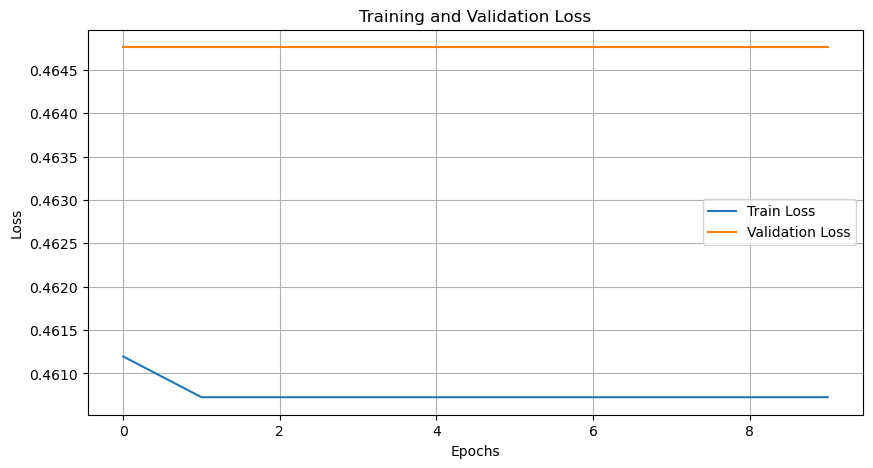

In [ ]:
plot_training(epoch_train_errors_dice, epoch_val_errors_dice)

Accuracy: 0.6077
{'0': {'precision': 0.6077116238317757, 'recall': 1.0, 'f1-score': 0.7559958077349376, 'support': 83232184.0, 'dice': np.float64(0.7559958077349377)}, 'micro avg': {'precision': 0.6077116238317757, 'recall': 1.0, 'f1-score': 0.7559958077349376, 'support': 83232184.0}, 'macro avg': {'precision': 0.6077116238317757, 'recall': 1.0, 'f1-score': 0.7559958077349376, 'support': 83232184.0, 'dice': 0.7559958077349377}, 'weighted avg': {'precision': 0.6077116238317757, 'recall': 1.0, 'f1-score': 0.7559958077349376, 'support': 83232184.0, 'dice': 0.7559958077349367}}
Dice: 0.7560


Reporte de clasificación:

               precision     recall      f1-score      support       dice    
0                0.61          1.0         0.76      83232184.0      0.76    
micro avg        0.61          1.0         0.76      83232184.0              
macro avg        0.61          1.0         0.76      83232184.0      0.76    
weighted avg     0.61          1.0         0.76      83232184.0  

/Users/nataliacampigliastemphelet/miniconda3/envs/taller-dl/lib/python3.13/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


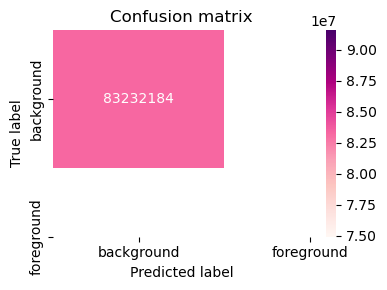

In [ ]:
acc, rep, cm = model_segmentation_report(
    unet_dice, test_loader_pad, DEVICE, 1,
    do_confusion_matrix=True, show_dice_loss=True
)

## Misma arquitectura pero con imágenes de entrada en RGB

# Transforms elegidas

In [ ]:
"""RandomResizedCrop, RandomScale o RandomZoom


train_dual_tfms = T.Compose([
    T.ToImage(),
    T.ToDtype(torch.uint8, scale=False), # imagen todavía en 0..255
    T.RandomHorizontalFlip(p=0.5),

    # Escala y recorte: hace que la red vea personas chicas y grandes
    T.RandomResizedCrop(size=IMG_SIZE, scale=(0.5, 1.0), ratio=(0.9, 1.1), antialias=True),

    # Rotación moderada por posibles inclinaciones
    T.RandomRotation(degrees=10, interpolation=T.InterpolationMode.BILINEAR),

    # Jitter de color solo en la imagen (no en la máscara)
    T.SanitizeBoundingBoxes(),          # seguro si luego usás boxes; si no, omite
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.02),

    # Convertir a float y normalizar al final
    T.ToDtype(torch.float32, scale=True),     # imagen 0..1
    T.Normalize(mean=MEAN, std=STD),
])

val_dual_tfms = T.Compose([
    T.ToImage(),
    T.ToDtype(torch.uint8, scale=False),
    T.Resize(IMG_SIZE, antialias=True),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=MEAN, std=STD),
])
"""
# Para la MÁSCARA:
# - usar las MISMAS transformaciones geométricas (flip, crop, resize, rotation)
# - SIEMPRE con interpolación NEAREST
#mask_geom_tfms = dict(interpolation=T.InterpolationMode.NEAREST)
